# COF Database Project

doi: https://pubs.acs.org/doi/epdf/10.1021/acs.chemmater.8b01425
<br>
Chem. Mater. 2018, 30, 15, 5069–5086

The database in this work contains:

- 18 813 interpenetrated 3D structures
- 42 386 noninterpenetrated 3D structures
- 8641 2D-layered structures

for a total of 69 840 structures.
<br>

- Absolute MU = total amount stored in porous material
- Excess MU = difference between total amount in system and amount present if no adsorption

<b>Units</b>
- molec/unit_cell = molecules per unit cell <-- expect features that are useful for describing unit cell to have high importance
- mol/kg = moles per kg
- v_STP/v = volume of gas delivered at standard temperature (0°C) and pressure (1 atm)
<br>
low P = depletion pressure /// high P = storage pressure
density refers to framework density
<br>

The journal explores in silico design of COF for Methane Storage applications and hence the model to make can be regression or classification.

<b>Regression task:</b>
-
- Prediction of the total methane uptake @ storage pressure

In [5]:
import pandas as pd
import numpy as np


from matplotlib import pyplot as plt
import seaborn as sns
# import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import (train_test_split, RepeatedKFold,
                                     RandomizedSearchCV, cross_validate,
                                     learning_curve, LearningCurveDisplay,
                                     # validation_curve, ValidationCurveDisplay
                                    )
from sklearn.inspection import permutation_importance
from sklearn.metrics import (mean_squared_error, root_mean_squared_error, r2_score, mean_absolute_error,
                             PredictionErrorDisplay, make_scorer
                            )
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

from xgboost import XGBRFRegressor

import optuna
# https://www.kaggle.com/code/alisultanov/regression-xgboost-optuna

import pickle


In [6]:
random_state = np.random.RandomState(48)

sns.set_style({
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.top': True,
    'ytick.right': True,
    'axes.spines.right': True,
    'axes.spines.top': True
})

# Data loading

In [7]:
data = pd.read_csv('properties.csv')

data.columns = data.columns.str.strip()
data.columns = data.columns.str.replace(' ','_').str.replace('absolute_methane_uptake','AbsMU').str.replace('excess_methane_uptake', 'xsMU')
data.head(10)

,dimensions,bond_type,name,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_error_high_P_[molec/unit_cell],...,num_sulfur,num_silicon,vertices,edges,genus,largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v]
0,2,amide,linker91_CO_linker87_NH_hcb_relaxed,0.900120,49204.128057,260.213228,10.95162,0.315667,233.2892,2.789059,...,0,0,1,1,0,17.19014,15.64961,17.19004,176.160498,20.988007
1,2,amide,linker91_CO_linker88_NH_hcb_relaxed,0.879234,49390.074419,297.963387,11.81756,0.478028,250.6164,3.464625,...,0,0,1,1,0,17.34916,15.76943,17.34916,188.532073,22.643282
2,2,amide,linker91_CO_linker7_NH_hcb_relaxed,0.858269,50036.985281,289.397249,11.86378,0.140491,255.1510,0.921036,...,0,0,1,1,0,16.84032,15.61907,16.84024,189.461764,22.566022
3,2,amide,linker91_CO_linker8_NH_hcb_relaxed,0.857065,49135.924517,370.063633,12.48842,0.823728,257.3368,2.377728,...,0,0,1,1,0,13.93085,12.32167,13.93085,194.588962,27.373459
4,2,amide,linker91_CO_linker10_NH_hcb_relaxed,0.858016,49540.680132,367.040151,12.25924,0.191371,253.2620,3.177484,...,0,0,1,1,0,16.06923,13.48791,16.06921,189.943092,24.774006
5,2,amide,linker91_CO_linker11_NH_hcb_relaxed,0.844621,50620.061016,323.860323,11.85720,0.764214,247.2346,3.970152,...,0,0,1,1,0,16.50191,15.88278,16.50182,181.468823,22.734157
6,2,amide,linker91_CO_linker12_NH_hcb_relaxed,0.867641,49366.372403,336.854866,12.15760,0.572041,258.7884,0.848714,...,0,0,1,1,0,15.66491,14.43767,15.66491,194.773123,26.753754
7,2,amide,linker91_CO_linker14_NH_hcb_relaxed,0.877187,22110.377364,236.793846,10.23260,0.221784,89.8460,1.119919,...,0,0,1,1,0,20.73294,18.61257,20.73294,150.979516,18.255471
8,2,amide,linker91_CO_linker16_NH_hcb_relaxed,0.895879,22218.182499,215.450426,9.96455,0.312734,88.2164,2.674405,...,0,0,1,1,0,22.21728,20.05506,22.21728,147.521812,16.512682
9,2,amide,linker91_CO_linker17_NH_hcb_relaxed,0.869602,22195.325470,276.268998,10.33178,0.231485,93.0500,1.597328,...,0,0,1,1,0,22.06483,20.41428,22.06483,155.765149,19.663739


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69840 entries, 0 to 69839
Data columns (total 53 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   dimensions                                                   69840 non-null  int64  
 1   bond_type                                                    69840 non-null  object 
 2   name                                                         69840 non-null  object 
 3   void_fraction_[widom]                                        69840 non-null  float64
 4   supercell_volume_[A^3]                                       69840 non-null  float64
 5   density_[kg/m^3]                                             69840 non-null  float64
 6   heat_desorption_high_P_[kJ/mol]                              69840 non-null  float64
 7   heat_desorption_error_high_P_[kJ/mol]                        69840 non-null 

In [9]:
data.shape

(69840, 53)

In [10]:
data.describe()

,dimensions,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_error_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],AbsMU_error_high_P_[mol/kg],...,num_sulfur,num_silicon,vertices,edges,genus,largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v]
count,69840.000000,6.984000e+04,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,...,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000
mean,2.876274,3.572308e+39,104076.959033,237.869940,10.316528,0.411669,378.867167,2.824216,33.446512,0.297706,...,0.208133,0.589419,1.160868,2.129396,7.367726,25.445615,20.363235,25.215133,152.004095,21.351317
std,0.329271,9.440631e+41,84614.971257,128.659560,2.785198,0.213946,255.630602,1.500280,10.715196,0.180403,...,3.390392,3.709546,0.464179,1.109000,6.221817,12.247666,10.446839,12.256158,37.795204,14.845232
min,2.000000,8.986130e-02,16781.738390,23.645299,5.256640,0.014913,5.211000,0.096075,0.237056,0.005693,...,0.000000,0.000000,1.000000,1.000000,0.000000,3.977050,3.683950,3.967230,5.119746,0.639796
25%,3.000000,8.513177e-01,47609.540079,142.977704,8.261238,0.274966,200.424650,1.759240,26.815143,0.170187,...,0.000000,0.000000,1.000000,1.000000,4.000000,16.530148,12.826320,16.321928,121.115207,12.073964
50%,3.000000,9.002350e-01,76949.015565,207.395116,9.653370,0.374991,303.063800,2.521954,32.300110,0.256590,...,0.000000,0.000000,1.000000,2.000000,5.000000,22.767675,18.265625,22.528190,147.695500,16.580910
75%,3.000000,9.325332e-01,132331.130326,305.094039,11.786172,0.500239,484.550450,3.555503,38.319745,0.378666,...,0.000000,0.000000,1.000000,3.000000,9.000000,31.857085,25.002355,31.561105,181.405439,25.032823
max,3.000000,2.494900e+44,816050.374898,1187.930244,27.686540,6.684007,1855.507800,14.037601,138.583930,2.467115,...,144.000000,96.000000,6.000000,10.000000,73.000000,87.030690,85.443470,86.982290,292.031749,211.731627


In [11]:
numvars = data.select_dtypes(exclude='object')#.astype('float_')
catvars = data.select_dtypes(include='object')

In [12]:
num_col = numvars.columns
cat_col = catvars.columns

for x in range(len(num_col)):
    print(f"{num_col[x]:<50}: {numvars[num_col[x]].min()} - {numvars[num_col[x]].max()}")

print("-" * 100, '\n\nCategorical Values\n')

for x in range(len(cat_col)):
    print(f"{cat_col[x]}:\n {catvars[cat_col[x]].unique()}\n")

dimensions                                        : 2 - 3
void_fraction_[widom]                             : 0.0898613 - 2.4949e+44
supercell_volume_[A^3]                            : 16781.738390284165 - 816050.3748983915
density_[kg/m^3]                                  : 23.645298659042 - 1187.930244313093
heat_desorption_high_P_[kJ/mol]                   : 5.25664 - 27.68654
heat_desorption_error_high_P_[kJ/mol]             : 0.014913 - 6.684007
AbsMU_high_P_[molec/unit_cell]                    : 5.211 - 1855.5078
AbsMU_error_high_P_[molec/unit_cell]              : 0.096075309 - 14.0376007409
AbsMU_high_P_[mol/kg]                             : 0.2370561449 - 138.583929882
AbsMU_error_high_P_[mol/kg]                       : 0.0056930822 - 2.4671150685
xsMU_high_P_[molec/unit_cell]                     : -6.547544690956778e+46 - 1304.7484994768
xsMU_error_high_P_[molec/unit_cell]               : 0.0 - 14.0376007409
xsMU_high_P_[mol/kg]                              : -2.66851008827799

# Visualising Data

## Numerical Values

### Continuous Data

In [13]:
numvars.select_dtypes('float64').describe()

,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_error_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],AbsMU_error_high_P_[mol/kg],xsMU_high_P_[molec/unit_cell],...,cell_b_[A],cell_c_[A],alpha_[deg],beta_[deg],gamma_[deg],largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v]
count,6.984000e+04,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,6.984000e+04,...,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000
mean,3.572308e+39,104076.959033,237.869940,10.316528,0.411669,378.867167,2.824216,33.446512,0.297706,-9.375064e+41,...,46.228195,44.010600,89.992755,89.995265,100.121887,25.445615,20.363235,25.215133,152.004095,21.351317
std,9.440631e+41,84614.971257,128.659560,2.785198,0.213946,255.630602,1.500280,10.715196,0.180403,2.477572e+44,...,14.277278,16.034008,0.744880,0.359733,14.238813,12.247666,10.446839,12.256158,37.795204,14.845232
min,8.986130e-02,16781.738390,23.645299,5.256640,0.014913,5.211000,0.096075,0.237056,0.005693,-6.547545e+46,...,23.589400,23.550900,51.478700,75.146600,16.883100,3.977050,3.683950,3.967230,5.119746,0.639796
25%,8.513177e-01,47609.540079,142.977704,8.261238,0.274966,200.424650,1.759240,26.815143,0.170187,1.147271e+02,...,34.545575,30.588450,90.000000,90.000000,90.000000,16.530148,12.826320,16.321928,121.115207,12.073964
50%,9.002350e-01,76949.015565,207.395116,9.653370,0.374991,303.063800,2.521954,32.300110,0.256590,1.759243e+02,...,43.353100,39.995850,90.000000,90.000000,90.000000,22.767675,18.265625,22.528190,147.695500,16.580910
75%,9.325332e-01,132331.130326,305.094039,11.786172,0.500239,484.550450,3.555503,38.319745,0.378666,2.678426e+02,...,55.019425,52.895075,90.000000,90.000000,120.000000,31.857085,25.002355,31.561105,181.405439,25.032823
max,2.494900e+44,816050.374898,1187.930244,27.686540,6.684007,1855.507800,14.037601,138.583930,2.467115,1.304748e+03,...,130.530000,150.752000,114.744000,110.943000,123.393000,87.030690,85.443470,86.982290,292.031749,211.731627


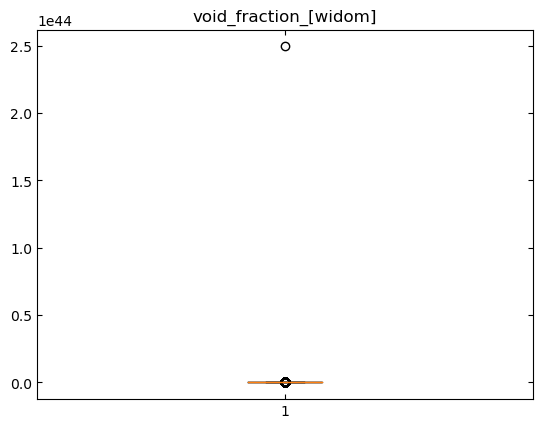

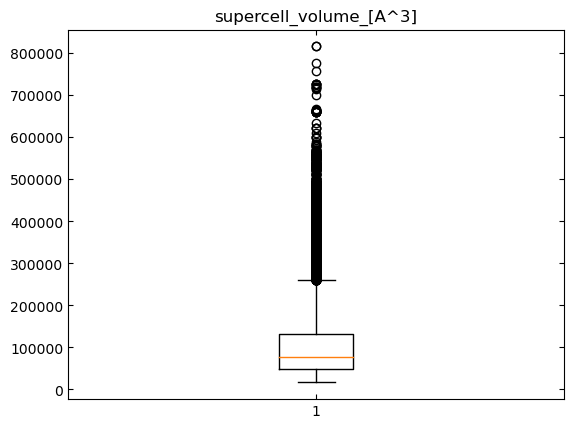

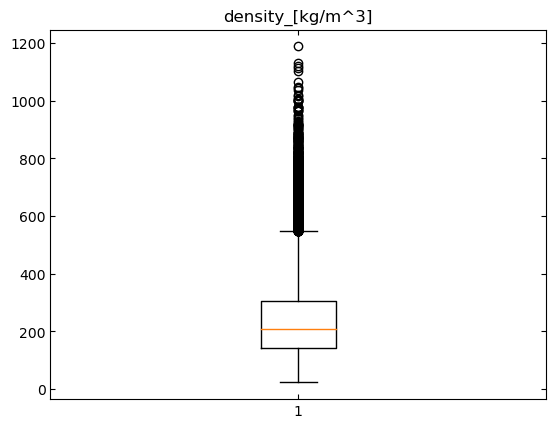

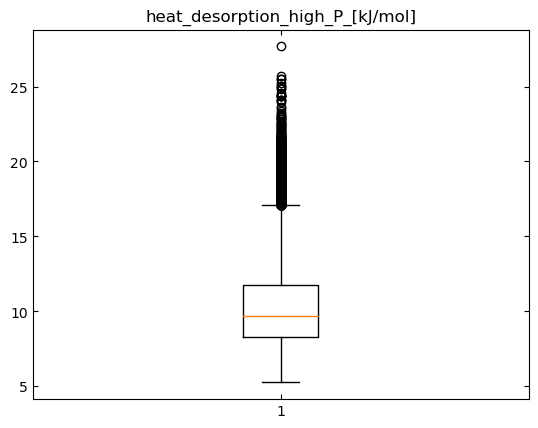

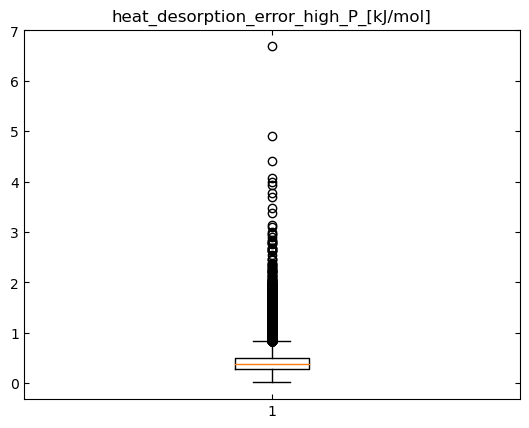

...

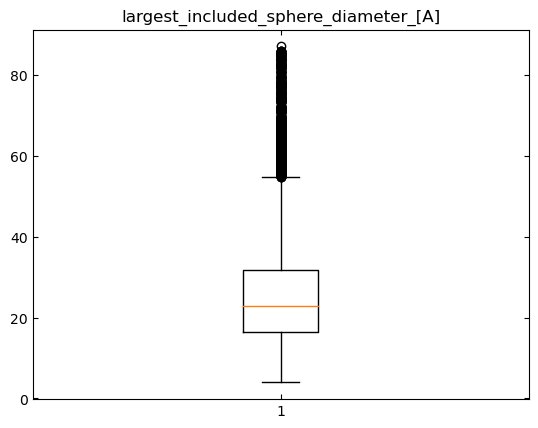

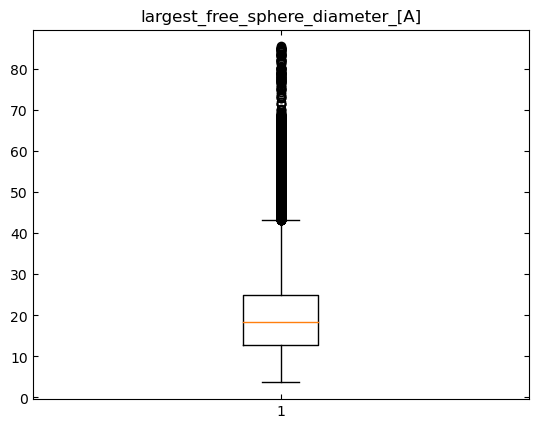

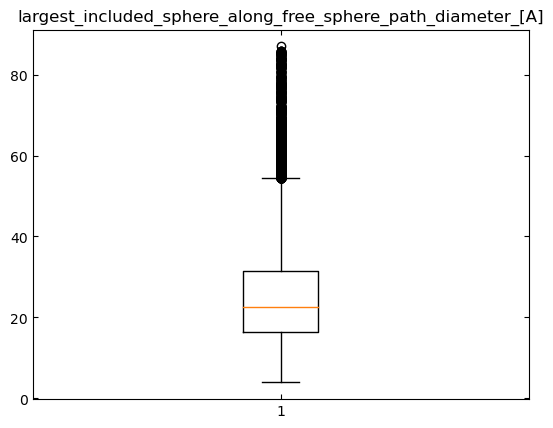

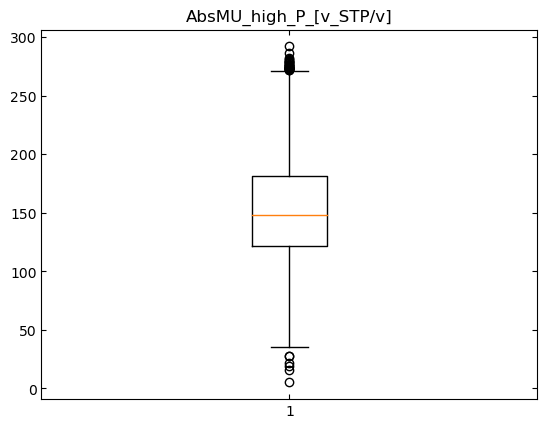

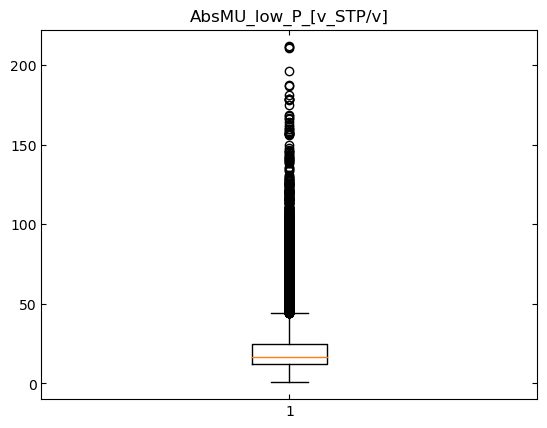

In [14]:
# Continuous values can be plotted as Boxplots
cont_val = [cont for cont in numvars.select_dtypes('float64').columns]
for f in range(len(cont_val)):
    plt.figure()
    plt.boxplot(numvars[cont_val[f]])
    plt.title(cont_val[f])
    plt.show()

### Discrete Data

In [15]:
numvars.select_dtypes('int64').describe()

,dimensions,num_carbon,num_fluorine,num_hydrogen,num_nitrogen,num_oxygen,num_sulfur,num_silicon,vertices,edges,genus
count,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000
mean,2.876274,717.747222,0.227405,470.472580,133.890621,52.223167,0.208133,0.589419,1.160868,2.129396,7.367726
std,0.329271,469.703907,6.496543,326.140262,121.185456,83.446966,3.390392,3.709546,0.464179,1.109000,6.221817
min,2.000000,108.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,3.000000,384.000000,0.000000,240.000000,60.000000,0.000000,0.000000,0.000000,1.000000,1.000000,4.000000
50%,3.000000,600.000000,0.000000,384.000000,96.000000,24.000000,0.000000,0.000000,1.000000,2.000000,5.000000
75%,3.000000,913.500000,0.000000,594.000000,192.000000,64.000000,0.000000,0.000000,1.000000,3.000000,9.000000
max,3.000000,5088.000000,432.000000,3456.000000,2304.000000,1536.000000,144.000000,96.000000,6.000000,10.000000,73.000000


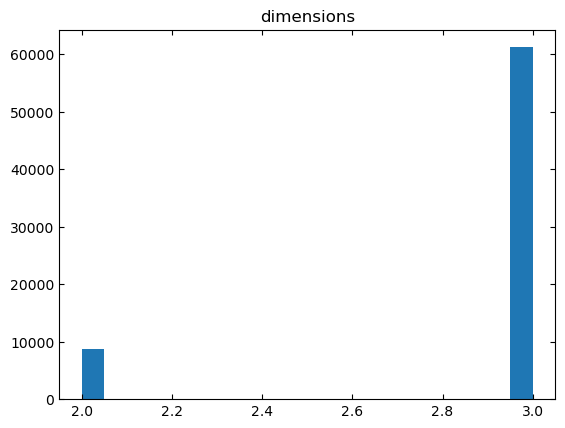

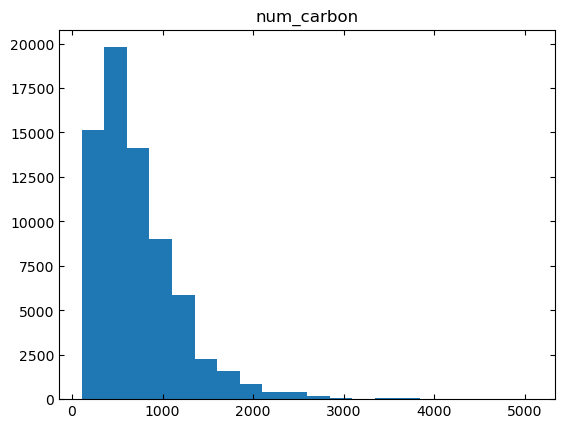

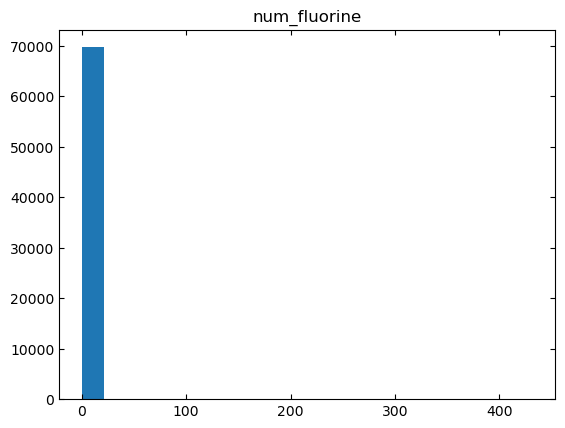

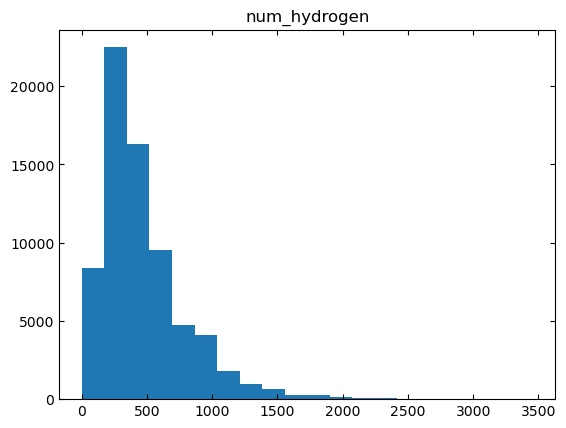

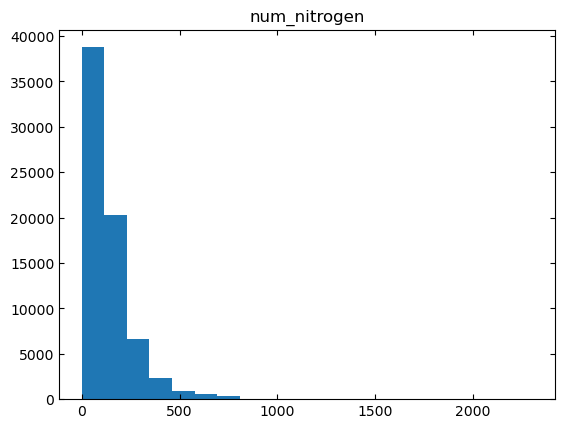

...

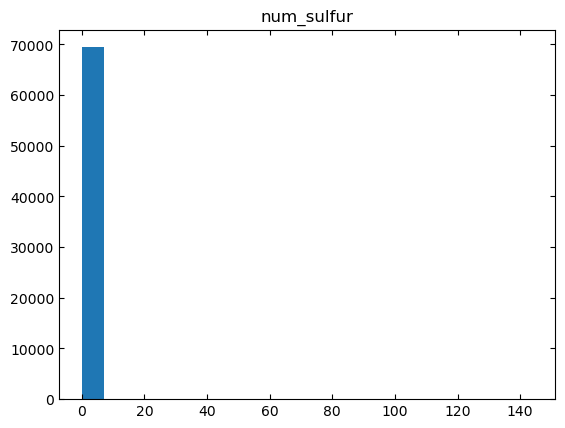

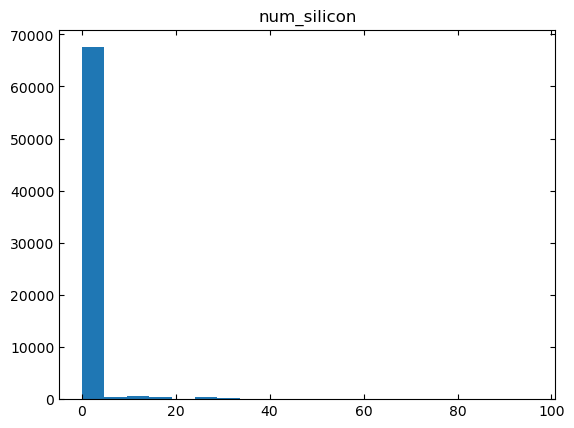

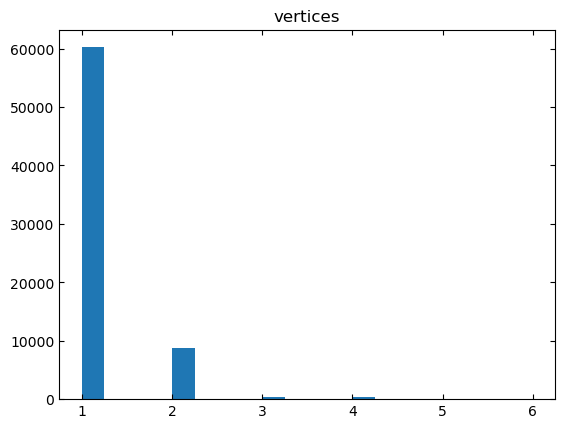

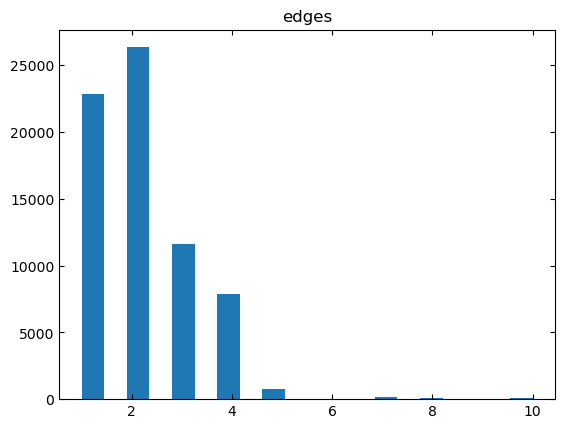

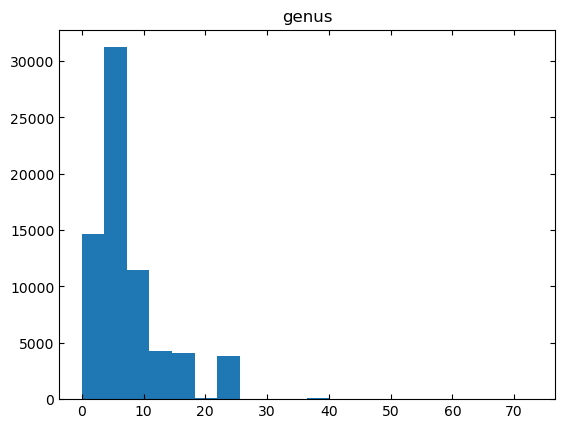

In [16]:
#Discrete data
disc_val = [disc for disc in numvars.select_dtypes('int64').columns]
for f in range(len(disc_val)):
    plt.figure()
    plt.hist(numvars[disc_val[f]], bins = 20)
    plt.title(disc_val[f])
    plt.show()

## Categorical Values

In [17]:
catvars.describe()

,bond_type,name,linkerA,linkerB,net,chemical_formula
count,69840,69840,69840,69840,69840,69840
unique,5,69840,124,649,342,19257
top,imine,linker91_CO_linker87_NH_hcb_relaxed,linker110_C,linker95_C,qtz,C624H384N128
freq,32530,1,2679,407,5536,105


- 5 unique bond types
- each bond type name is unique --> <b> drop </b>
- linker A and B describe the combinations present
- net represents the type of COF network
- chemical_formula --> <b> drop? or use as response </b>

# Data Formulation

In [18]:
# Drop error features since they are not necessary

drop_numvars = [
    'AbsMU_error_high_P_[molec/unit_cell]',
    'AbsMU_error_high_P_[mol/kg]',
    'AbsMU_error_low_P_[molec/unit_cell]',
    'AbsMU_error_low_P_[mol/kg]',
    'xsMU_error_high_P_[molec/unit_cell]',
    'xsMU_error_high_P_[mol/kg]',
    'xsMU_error_low_P_[molec/unit_cell]',
    'xsMU_error_low_P_[mol/kg]'
]

# Drop the columns and change data type to the same (float_)
numvars_dropped = numvars.drop(drop_numvars, axis =1, inplace=False).astype('float_')
numvars_dropped.head()

,dimensions,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],xsMU_high_P_[molec/unit_cell],xsMU_high_P_[mol/kg],...,num_sulfur,num_silicon,vertices,edges,genus,largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v]
0,2.0,0.900120,49204.128057,260.213228,10.95162,0.315667,233.2892,30.256085,153.346127,19.887991,...,0.0,0.0,1.0,1.0,0.0,17.19014,15.64961,17.19004,176.160498,20.988007
1,2.0,0.879234,49390.074419,297.963387,11.81756,0.478028,250.6164,28.278470,172.233191,19.434048,...,0.0,0.0,1.0,1.0,0.0,17.34916,15.76943,17.34916,188.532073,22.643282
2,2.0,0.858269,50036.985281,289.397249,11.86378,0.140491,255.1510,29.259086,177.634626,20.370003,...,0.0,0.0,1.0,1.0,0.0,16.84032,15.61907,16.84024,189.461764,22.566022
3,2.0,0.857065,49135.924517,370.063633,12.48842,0.823728,257.3368,23.500406,181.323116,16.558715,...,0.0,0.0,1.0,1.0,0.0,13.93085,12.32167,13.93085,194.588962,27.373459
4,2.0,0.858016,49540.680132,367.040151,12.25924,0.191371,253.2620,23.128289,176.537117,16.121650,...,0.0,0.0,1.0,1.0,0.0,16.06923,13.48791,16.06921,189.943092,24.774006


In [19]:
# Using domain knowledge and intuition, drop the categorical columns
drop_catvars = ['name', 'chemical_formula', 'net']

catvars["net_parent"] = catvars.net.str.split('-', expand=True)[0]
catvars_dropped = catvars.drop(drop_catvars, axis = 1, inplace=False)
catvars_dropped.head()

,bond_type,linkerA,linkerB,net_parent
0,amide,linker91_CO,linker87_NH,hcb
1,amide,linker91_CO,linker88_NH,hcb
2,amide,linker91_CO,linker7_NH,hcb
3,amide,linker91_CO,linker8_NH,hcb
4,amide,linker91_CO,linker10_NH,hcb


In [20]:
# Concatenate cleaned num and cat variables
data_viz = pd.concat([numvars_dropped, catvars_dropped], axis=1)
data_viz.head()

,dimensions,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],xsMU_high_P_[molec/unit_cell],xsMU_high_P_[mol/kg],...,genus,largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v],bond_type,linkerA,linkerB,net_parent
0,2.0,0.900120,49204.128057,260.213228,10.95162,0.315667,233.2892,30.256085,153.346127,19.887991,...,0.0,17.19014,15.64961,17.19004,176.160498,20.988007,amide,linker91_CO,linker87_NH,hcb
1,2.0,0.879234,49390.074419,297.963387,11.81756,0.478028,250.6164,28.278470,172.233191,19.434048,...,0.0,17.34916,15.76943,17.34916,188.532073,22.643282,amide,linker91_CO,linker88_NH,hcb
2,2.0,0.858269,50036.985281,289.397249,11.86378,0.140491,255.1510,29.259086,177.634626,20.370003,...,0.0,16.84032,15.61907,16.84024,189.461764,22.566022,amide,linker91_CO,linker7_NH,hcb
3,2.0,0.857065,49135.924517,370.063633,12.48842,0.823728,257.3368,23.500406,181.323116,16.558715,...,0.0,13.93085,12.32167,13.93085,194.588962,27.373459,amide,linker91_CO,linker8_NH,hcb
4,2.0,0.858016,49540.680132,367.040151,12.25924,0.191371,253.2620,23.128289,176.537117,16.121650,...,0.0,16.06923,13.48791,16.06921,189.943092,24.774006,amide,linker91_CO,linker10_NH,hcb


In [21]:
data_viz.describe()

,dimensions,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],xsMU_high_P_[molec/unit_cell],xsMU_high_P_[mol/kg],...,num_sulfur,num_silicon,vertices,edges,genus,largest_included_sphere_diameter_[A],largest_free_sphere_diameter_[A],largest_included_sphere_along_free_sphere_path_diameter_[A],AbsMU_high_P_[v_STP/v],AbsMU_low_P_[v_STP/v]
count,69840.000000,6.984000e+04,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,6.984000e+04,6.984000e+04,...,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000
mean,2.876274,3.572308e+39,104076.959033,237.869940,10.316528,0.411669,378.867167,33.446512,-9.375064e+41,-3.820891e+40,...,0.208133,0.589419,1.160868,2.129396,7.367726,25.445615,20.363235,25.215133,152.004095,21.351317
std,0.329271,9.440631e+41,84614.971257,128.659560,2.785198,0.213946,255.630602,10.715196,2.477572e+44,1.009757e+43,...,3.390392,3.709546,0.464179,1.109000,6.221817,12.247666,10.446839,12.256158,37.795204,14.845232
min,2.000000,8.986130e-02,16781.738390,23.645299,5.256640,0.014913,5.211000,0.237056,-6.547545e+46,-2.668510e+45,...,0.000000,0.000000,1.000000,1.000000,0.000000,3.977050,3.683950,3.967230,5.119746,0.639796
25%,3.000000,8.513177e-01,47609.540079,142.977704,8.261238,0.274966,200.424650,26.815143,1.147271e+02,1.695898e+01,...,0.000000,0.000000,1.000000,1.000000,4.000000,16.530148,12.826320,16.321928,121.115207,12.073964
50%,3.000000,9.002350e-01,76949.015565,207.395116,9.653370,0.374991,303.063800,32.300110,1.759243e+02,1.833841e+01,...,0.000000,0.000000,1.000000,2.000000,5.000000,22.767675,18.265625,22.528190,147.695500,16.580910
75%,3.000000,9.325332e-01,132331.130326,305.094039,11.786172,0.500239,484.550450,38.319745,2.678426e+02,1.960156e+01,...,0.000000,0.000000,1.000000,3.000000,9.000000,31.857085,25.002355,31.561105,181.405439,25.032823
max,3.000000,2.494900e+44,816050.374898,1187.930244,27.686540,6.684007,1855.507800,138.583930,1.304748e+03,2.617691e+01,...,144.000000,96.000000,6.000000,10.000000,73.000000,87.030690,85.443470,86.982290,292.031749,211.731627


/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

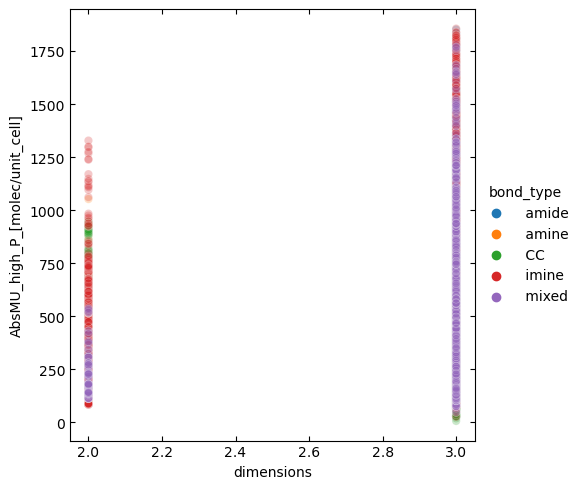

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

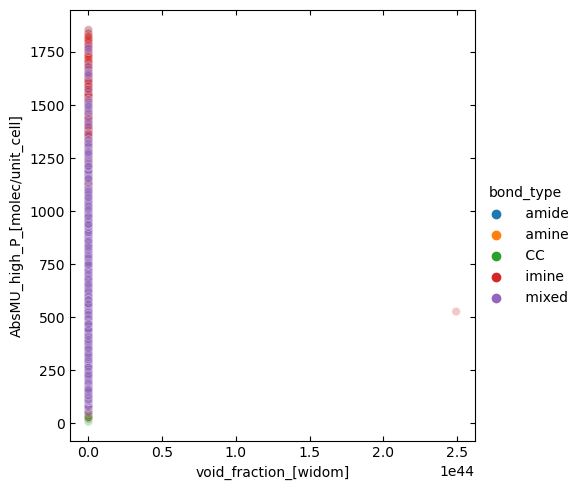

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

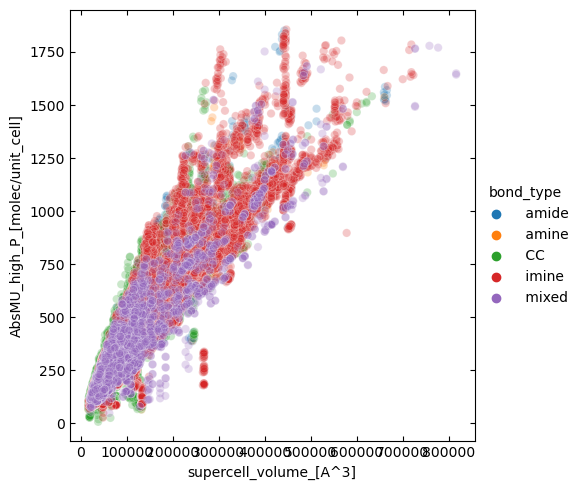

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

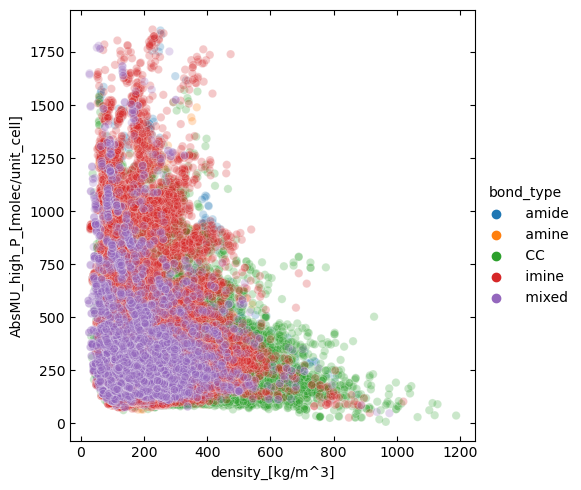

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

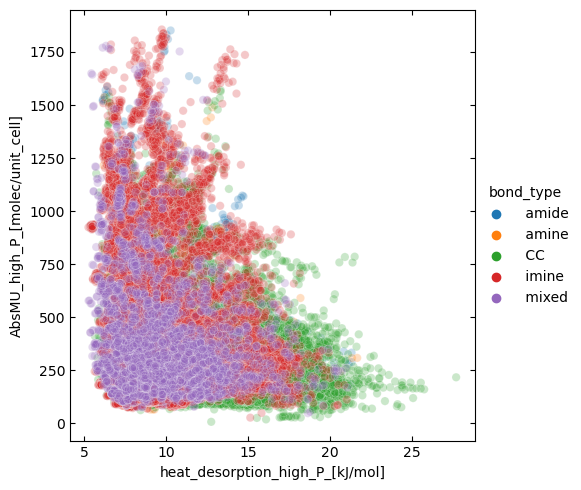

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

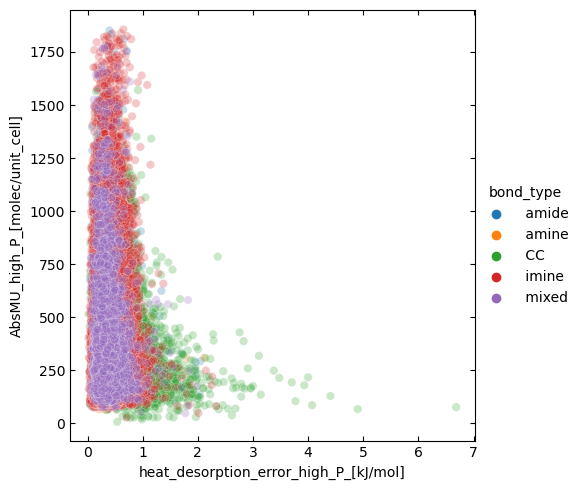

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

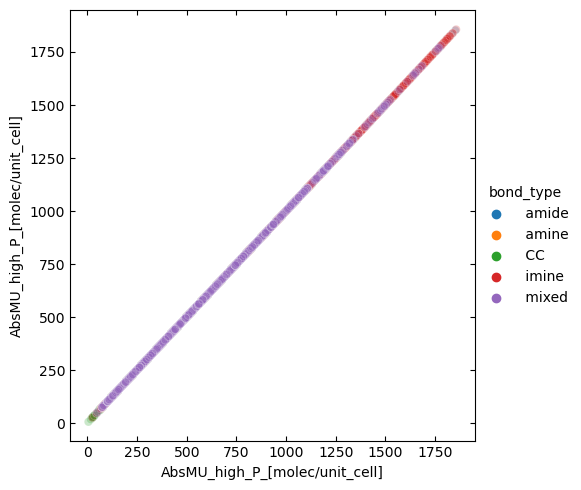

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

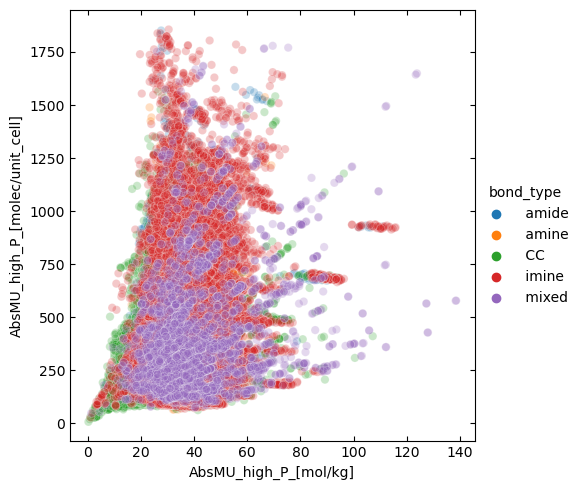

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

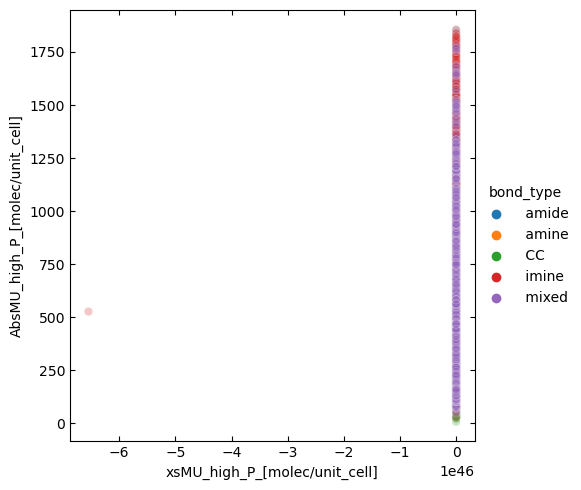

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

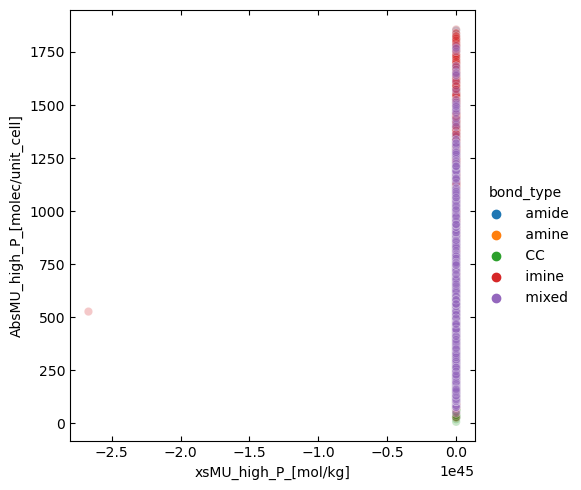

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

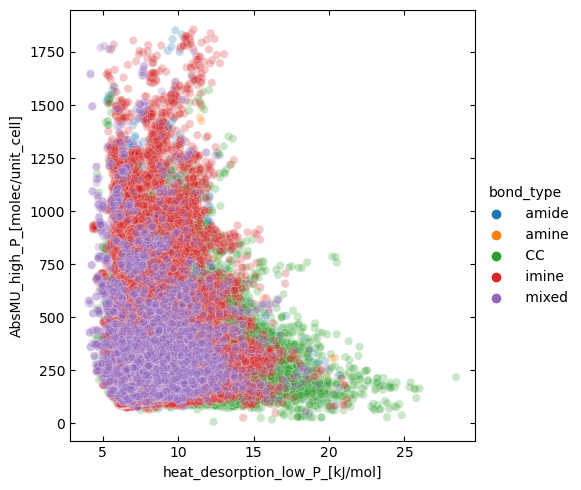

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

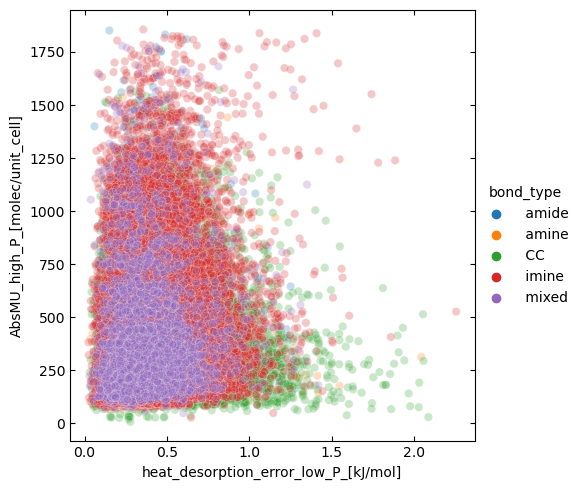

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

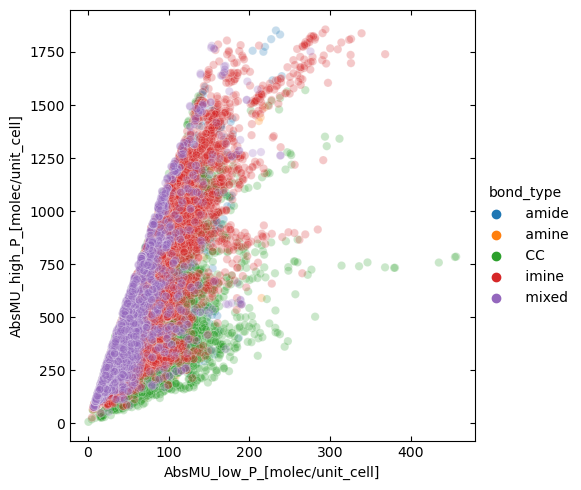

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

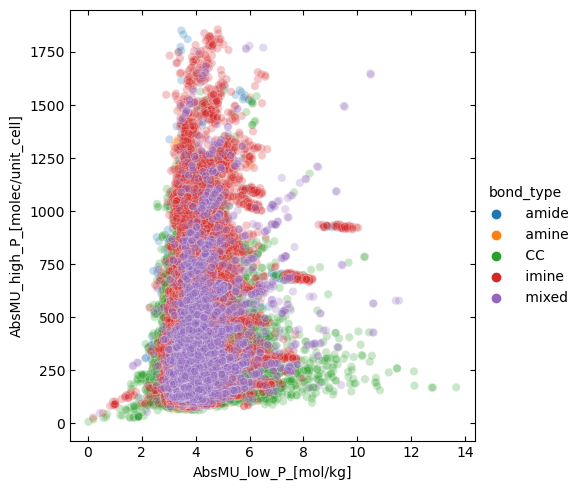

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

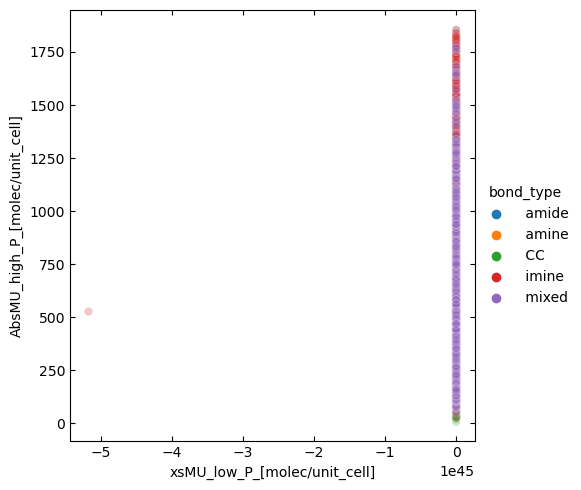

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

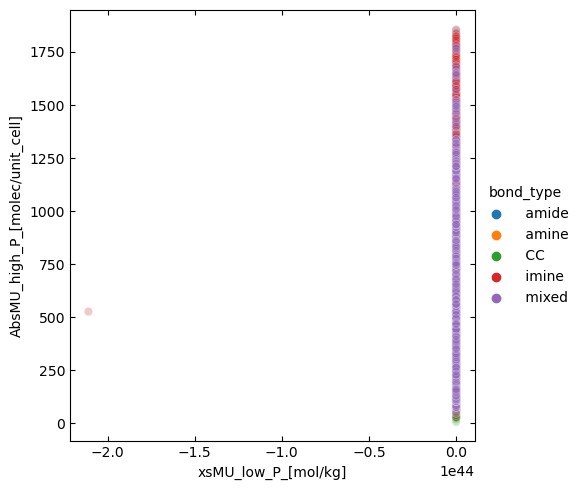

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

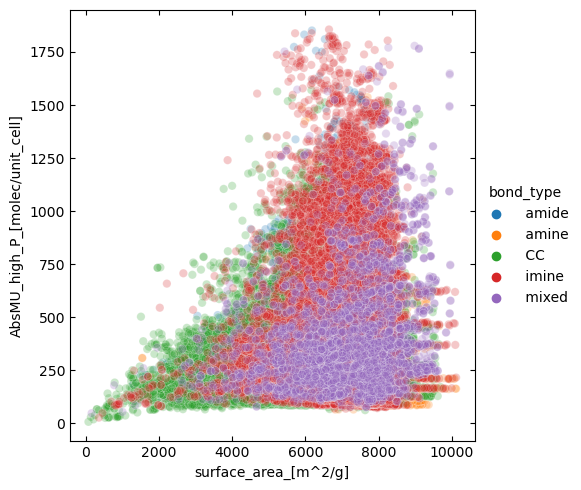

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

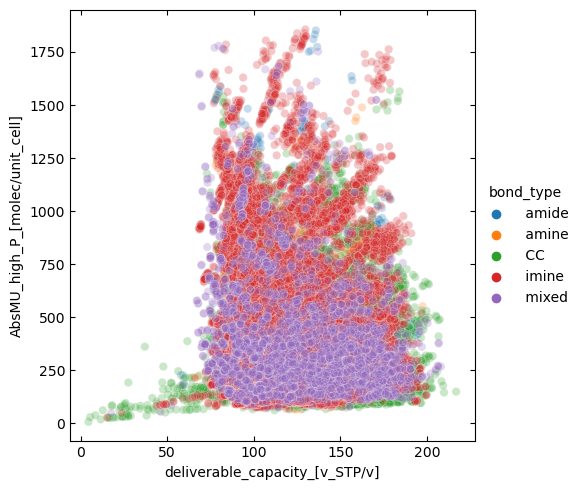

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

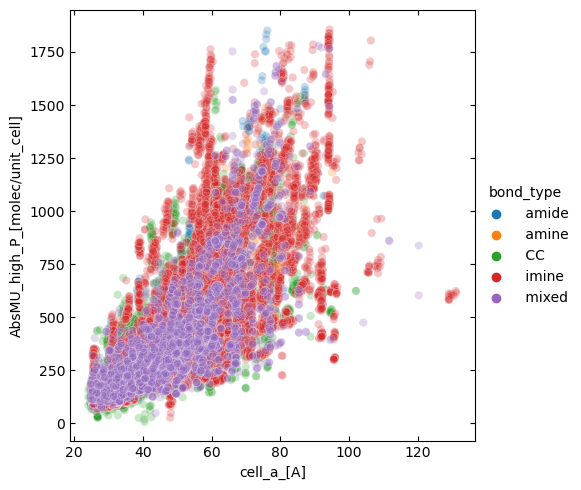

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

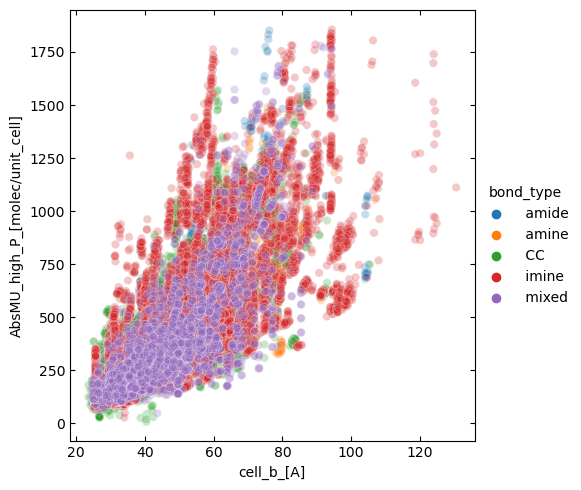

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

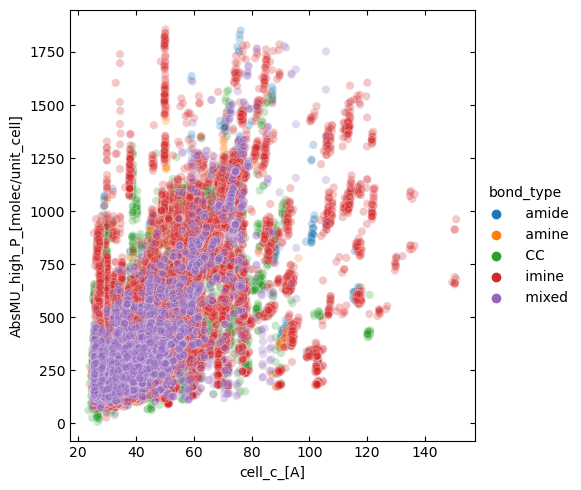

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

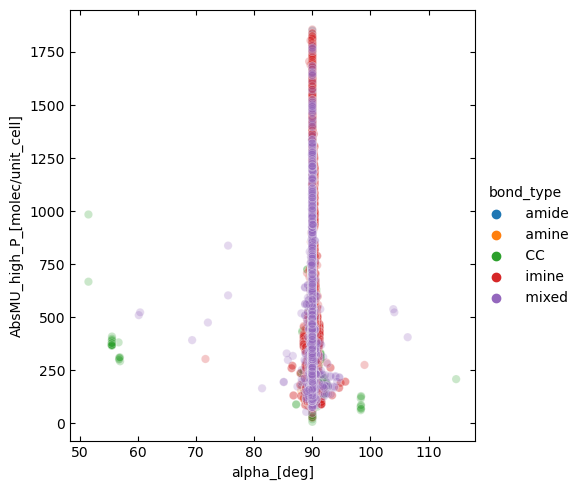

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

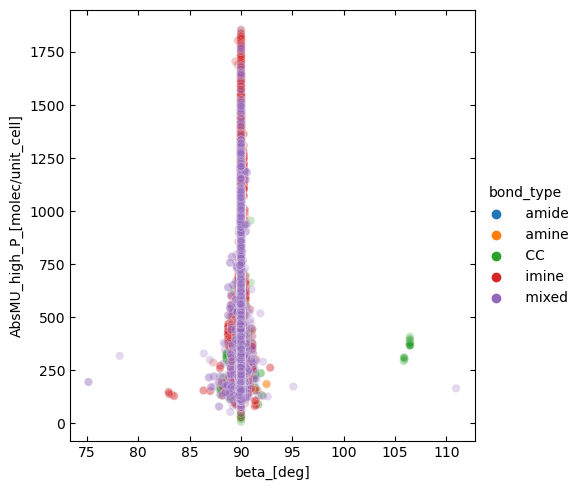

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

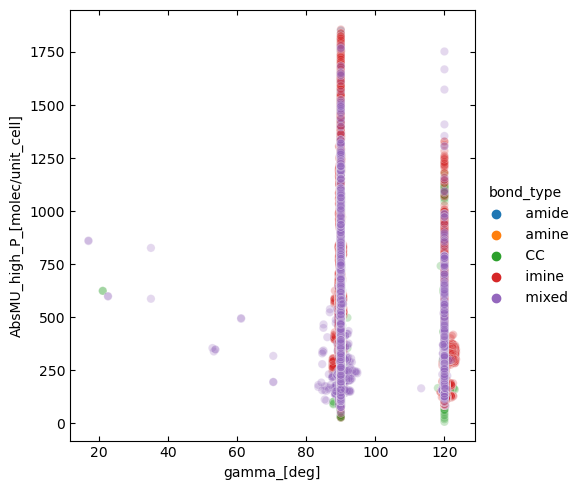

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

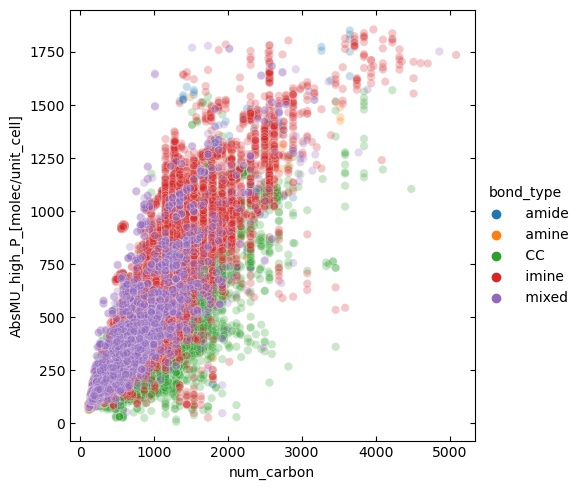

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

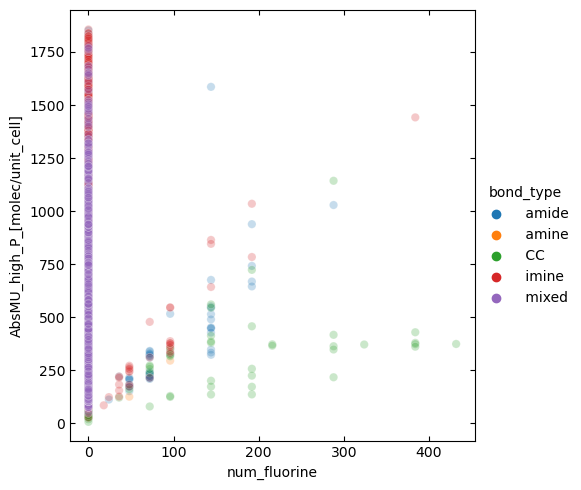

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

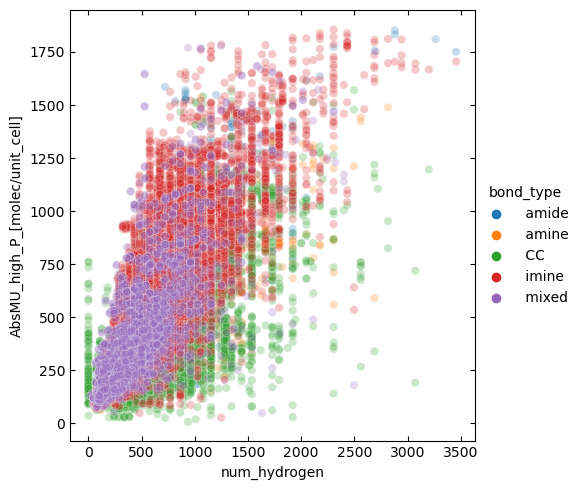

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

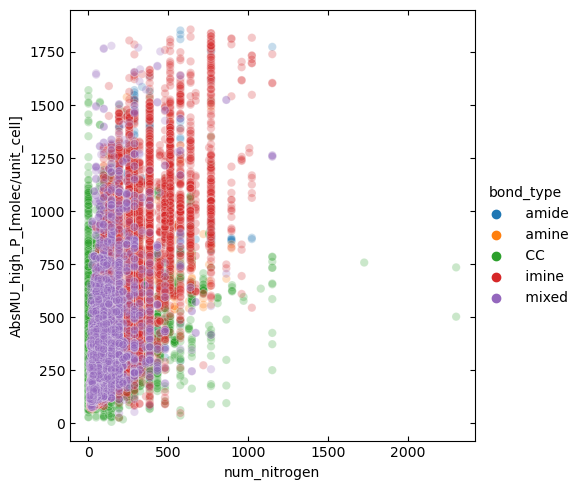

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

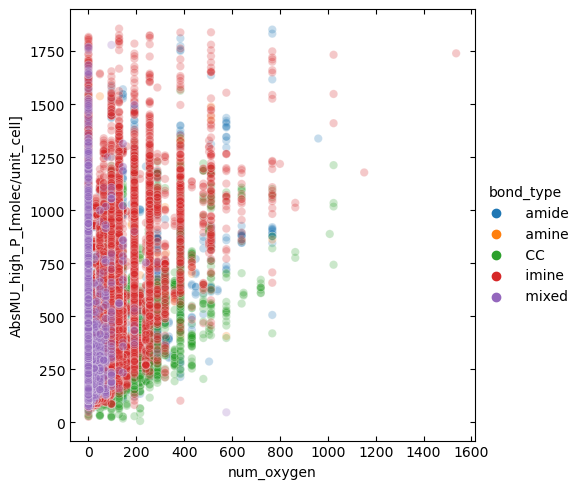

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

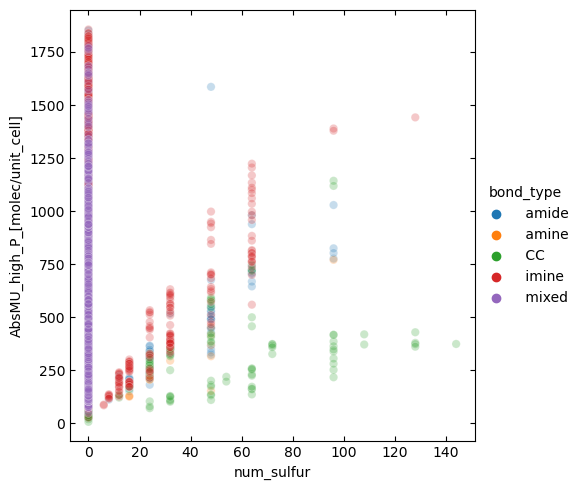

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

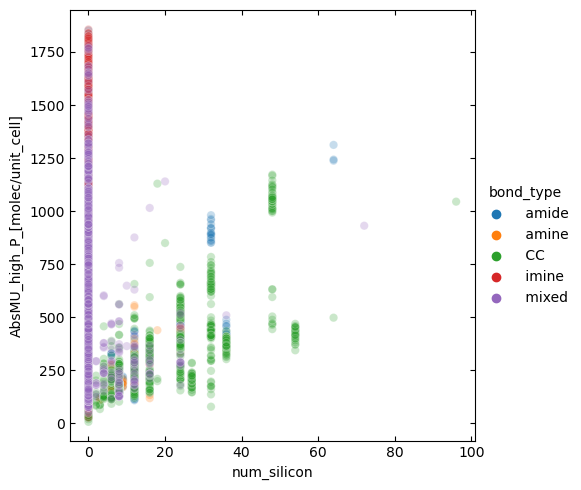

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

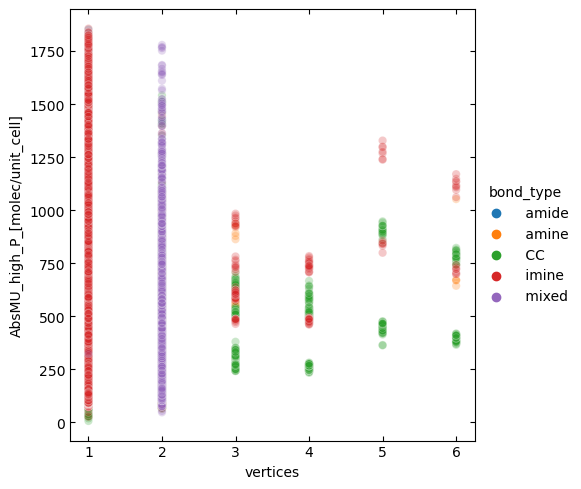

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

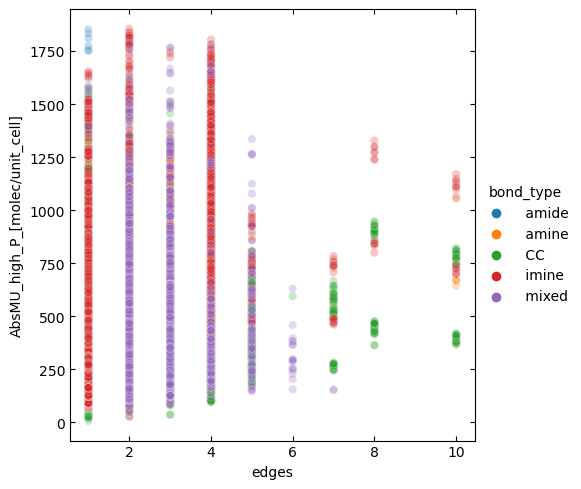

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

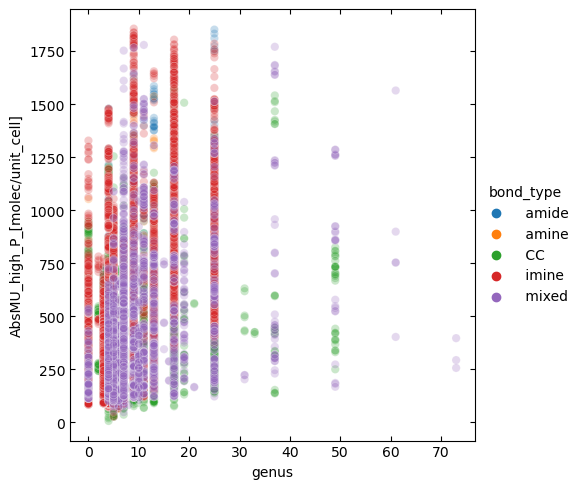

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

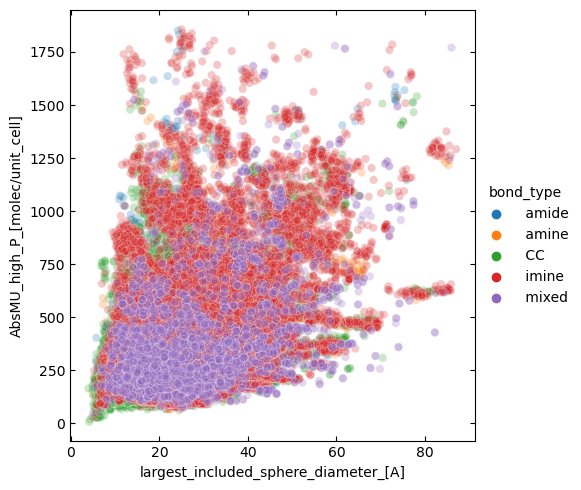

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

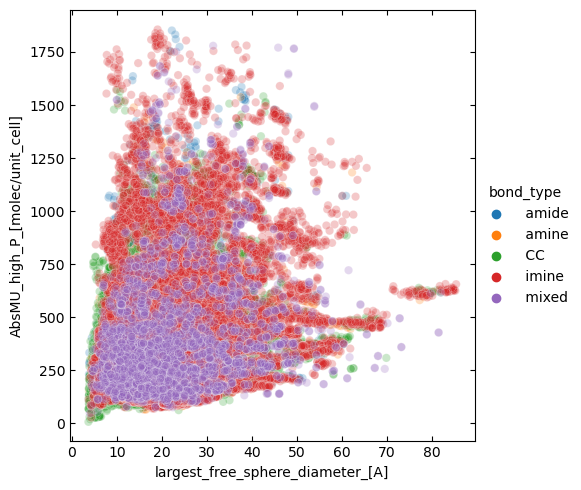

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

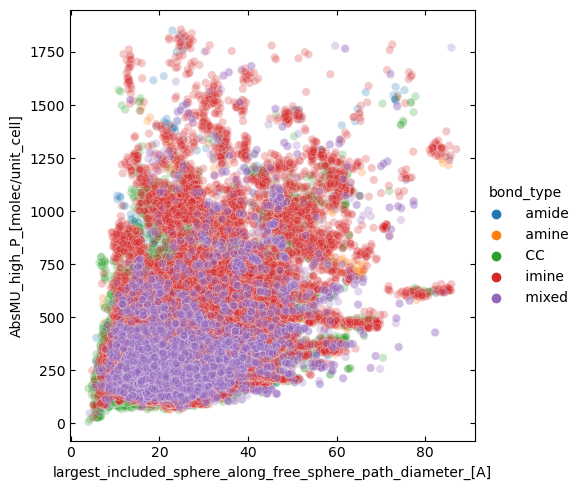

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

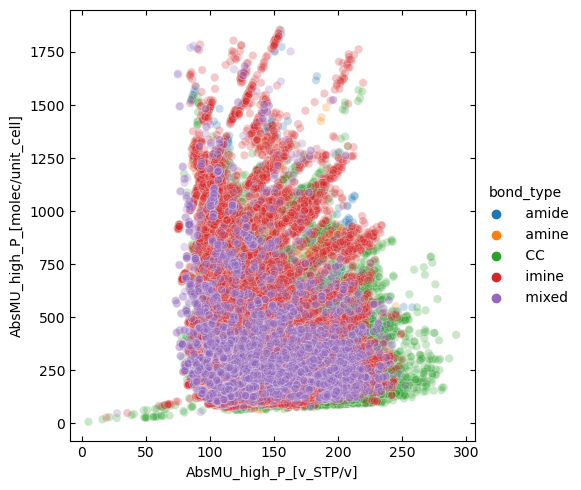

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

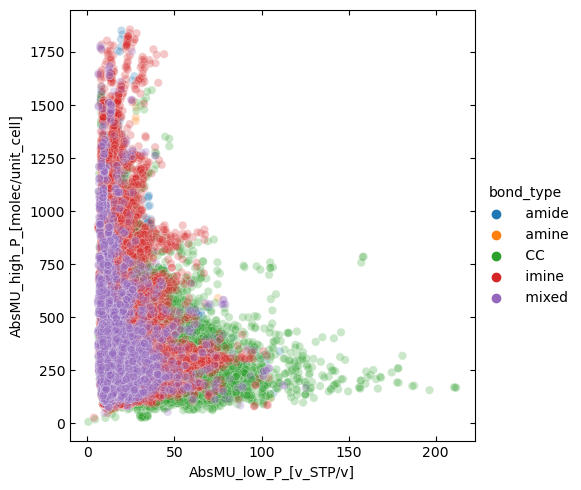

In [22]:
# Plot the relationship between our response and num var, grouped by bond_type

data_col = [col for col in data_viz]
for i in range(len(data_col[:-4])):
    plt.figure()
    sns.relplot(
        data=data_viz, x=data_col[i], y = 'AbsMU_high_P_[molec/unit_cell]',
        hue = 'bond_type',
        alpha = 0.25, facet_kws=dict(despine=False))
    
#     sns.set_style({
#     'xtick.direction': 'in',
#     'ytick.direction': 'in',
#     'xtick.top': True,
#     'ytick.right': True,
#     'axes.spines.right': True,
#     'axes.spines.top': True
# })
    plt.show()

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

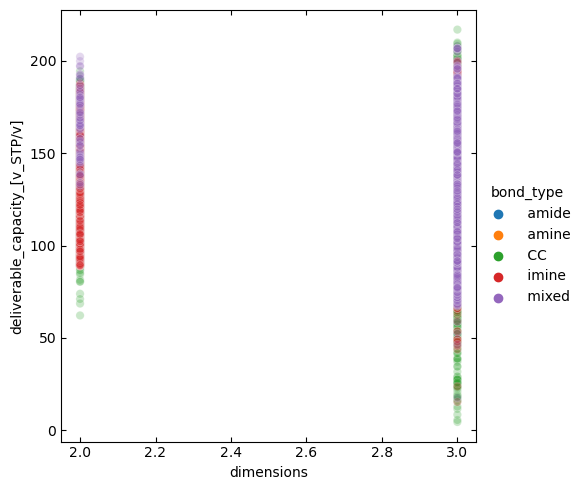

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

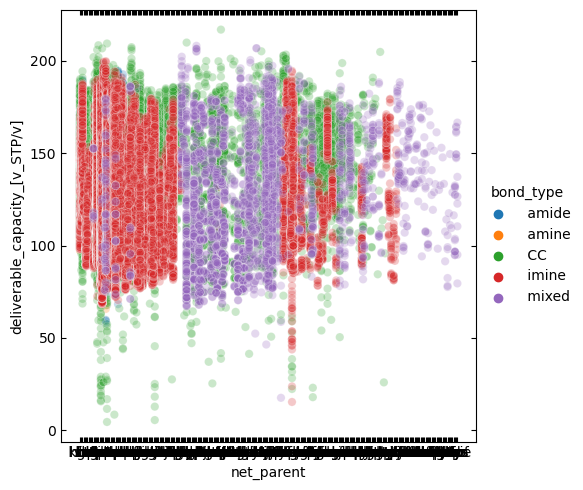

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

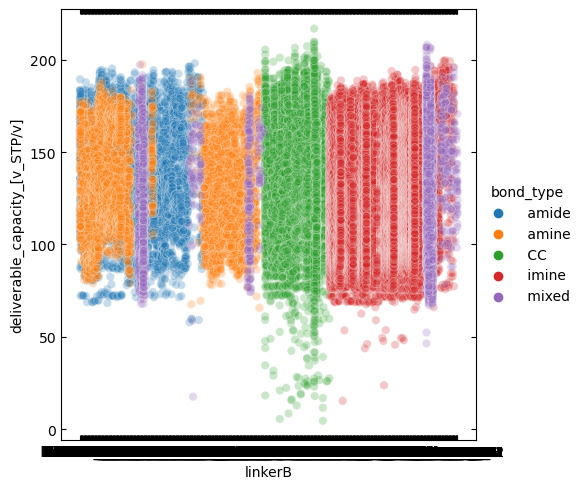

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

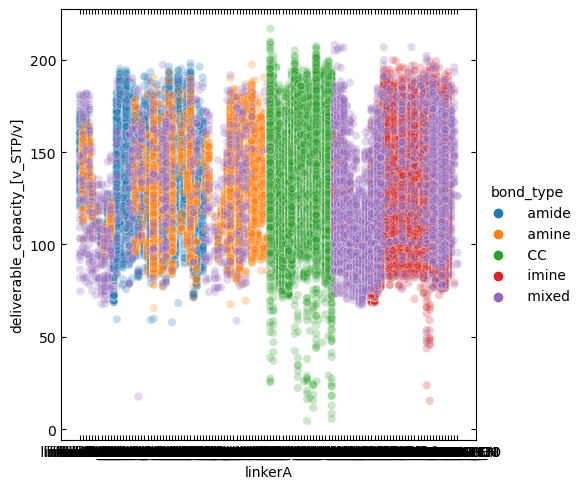

/Applications/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

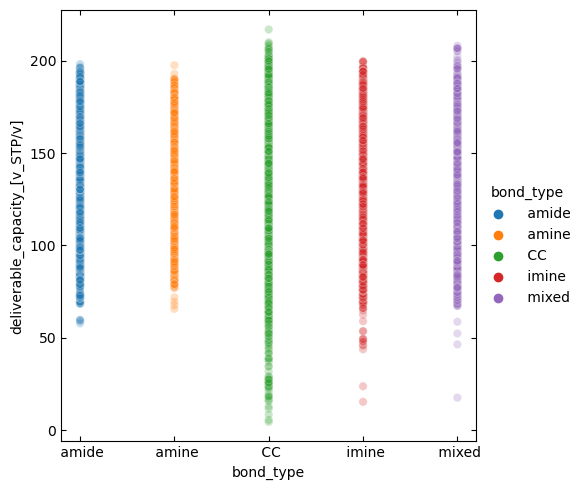

In [23]:
# Plot the relationship between our response and cat var, grouped by bond_type

data_col = [col for col in data_viz]
for i in range(len(data_col[-5:])):
    # print(data_col[-i])
    plt.figure()
    sns.relplot(data=data_viz, x=data_col[-i], y = 'deliverable_capacity_[v_STP/v]', hue = 'bond_type', alpha=0.25, facet_kws=dict(despine=False))
    plt.show()

In [24]:
# # Play around with the 3D viz

# fig = px.scatter_3d(data_viz[data_viz['dimensions']==2.0],
#                     x='supercell_volume_[A^3]',
#                     y='largest_included_sphere_along_free_sphere_path_diameter_[A]',
#                     z='AbsMU_high_P_[mol/kg]',
#                     color='bond_type', opacity=0.05,
#                    )
# fig.show()

In [25]:
# Could be interesting to consult the effect of dimensionality of frameworks
data_2d = data_viz[data_viz.dimensions == 2.0]
data_3d = data_viz[data_viz.dimensions == 3.0]

In [26]:
# Categorical values are better represented if onehot encoded -----> Features to onehot encode = (linkerA, linkerB, net, bond_type)

catvars_onehot = pd.get_dummies(catvars[catvars.columns[~catvars.columns.isin(drop_catvars)]], dtype='float_')
data_clean = pd.concat([numvars_dropped, catvars_onehot], axis = 1)
print(f'Shape of cleaned data: {data_clean.shape}')
data_clean.head()

Shape of cleaned data: (69840, 1126)


,dimensions,void_fraction_[widom],supercell_volume_[A^3],density_[kg/m^3],heat_desorption_high_P_[kJ/mol],heat_desorption_error_high_P_[kJ/mol],AbsMU_high_P_[molec/unit_cell],AbsMU_high_P_[mol/kg],xsMU_high_P_[molec/unit_cell],xsMU_high_P_[mol/kg],...,net_parent_ wix,net_parent_ wjh,net_parent_ wse,net_parent_ xaa,net_parent_ xad,net_parent_ xai,net_parent_ xci,net_parent_ xux,net_parent_ zme,net_parent_ zni
0,2.0,0.900120,49204.128057,260.213228,10.95162,0.315667,233.2892,30.256085,153.346127,19.887991,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,0.879234,49390.074419,297.963387,11.81756,0.478028,250.6164,28.278470,172.233191,19.434048,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.858269,50036.985281,289.397249,11.86378,0.140491,255.1510,29.259086,177.634626,20.370003,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,0.857065,49135.924517,370.063633,12.48842,0.823728,257.3368,23.500406,181.323116,16.558715,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2.0,0.858016,49540.680132,367.040151,12.25924,0.191371,253.2620,23.128289,176.537117,16.121650,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
# Top deliverable capacity for each net

(data_viz
 .groupby('net_parent')[['deliverable_capacity_[v_STP/v]','AbsMU_high_P_[v_STP/v]']]
 # .size().sort_values(ascending=False)
 .max()
 .sort_values(by='deliverable_capacity_[v_STP/v]', ascending=False)
 # .value_counts()
).head(7)

,deliverable_capacity_[v_STP/v],AbsMU_high_P_[v_STP/v]
net_parent,,
tbd,216.894111,266.440688
bod,209.884881,260.889263
qtz,209.366971,272.519052
lcs,208.430227,244.459397
clh,208.120454,282.400796
uon,207.395782,254.013544
phx,206.864600,237.847152


Best predicted COF has tbd network, based on deliverable capacity of 216.89 v_STP/v or etk based on AbsMU at high P of 292

# Data Transformation

In [28]:
# list of features that could be used as a response
responses = [
    'AbsMU_high_P_[molec/unit_cell]',
    'AbsMU_high_P_[mol/kg]',
    'AbsMU_high_P_[v_STP/v]',
    'AbsMU_low_P_[molec/unit_cell]',
    'AbsMU_low_P_[mol/kg]',
    'AbsMU_low_P_[v_STP/v]',
    'xsMU_high_P_[molec/unit_cell]',
    'xsMU_high_P_[mol/kg]',
    'xsMU_low_P_[molec/unit_cell]',
    'xsMU_low_P_[mol/kg]',
]
# drop_features = ['net']

In [90]:
# Splitting data to X and y
X = data_clean.drop(responses, axis = 1, inplace=False)
y = numvars[responses[0]]

X.shape, y.shape

# y_high_P = numvars['AbsMU_high_P_[molec/unit_cell]']
# y_low_P = numvars['AbsMU_low_P_[molec/unit_cell]']

# X.shape
# y_high_P.shape
# y_low_P.shape

((69840, 1116), (69840,))

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

print(X_train.shape)
print(X_test.shape)

(55872, 1116)
(13968, 1116)


# Feature importance

There are <code>1116</code> features would result in excruciatingly slow model performance. Using RandomForest, we will find feature importance based on mean decrease of purity.

In [31]:
forest = RandomForestRegressor(random_state=random_state).fit(X_train, y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)


Text(0.5, 1.0, 'Feature Importance for Absolute Methane Uptake at high pressure')

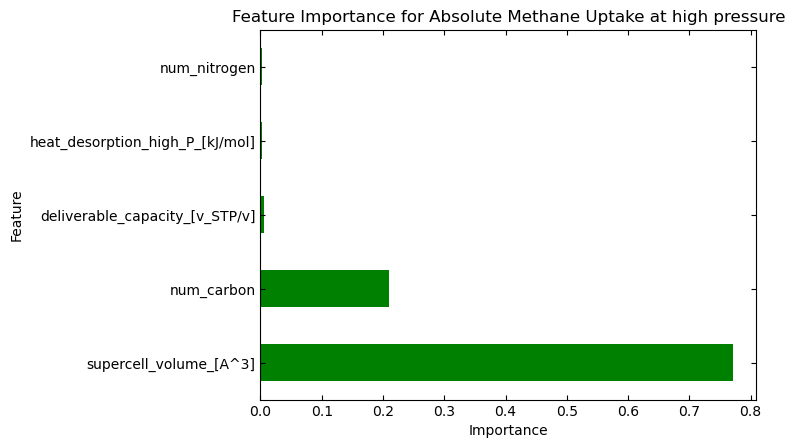

In [92]:
# Visualising the top 5 feature importance 

feature_importances_ = pd.Series(importances, index=X_train.columns)
feature_importances_.sort_values(ascending=False, inplace=True)
feature_importances_.head(5).plot.barh(color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance for Absolute Methane Uptake at high pressure")
plt.show()

In [32]:
# Showing all features above an importance threshold

index = []
threshold = 1e-4
indicies = np.argsort(importances)[::-1]

print(f'Features above threshold (={threshold})\n')
for f in range(50):
    if importances[indicies[f]] > threshold:
        print(f"{f+1:>4}. Feature {X.columns[indicies[f]]}: ({importances[indicies[f]]:.7f})")
        index.append(X.columns[indicies[f]])

# Only keep features above the threshold for model
X_relevant = X[index]


Features above threshold (=0.0001)

   1. Feature supercell_volume_[A^3]: (0.7709178)
   2. Feature num_carbon: (0.2091488)
   3. Feature deliverable_capacity_[v_STP/v]: (0.0064314)
   4. Feature heat_desorption_high_P_[kJ/mol]: (0.0028038)
   5. Feature num_nitrogen: (0.0022584)
   6. Feature cell_b_[A]: (0.0019809)
   7. Feature cell_a_[A]: (0.0012210)
   8. Feature void_fraction_[widom]: (0.0010381)
   9. Feature cell_c_[A]: (0.0010040)
  10. Feature heat_desorption_low_P_[kJ/mol]: (0.0005656)
  11. Feature density_[kg/m^3]: (0.0004080)
  12. Feature largest_included_sphere_along_free_sphere_path_diameter_[A]: (0.0002816)
  13. Feature largest_included_sphere_diameter_[A]: (0.0002698)
  14. Feature surface_area_[m^2/g]: (0.0002382)
  15. Feature genus: (0.0002239)
  16. Feature largest_free_sphere_diameter_[A]: (0.0002100)
  17. Feature edges: (0.0001129)


Since our response is measured in molec/unit_cell, it is understandable that the features attributed to volume was the most important feature (0.771). We can also see that number of carbons is also relevant for deciding framework (makes sense since most frameworks consist of carbons).

## Data Cleaning

In [33]:
# Check values are all okay

X_relevant.describe()


,supercell_volume_[A^3],num_carbon,deliverable_capacity_[v_STP/v],heat_desorption_high_P_[kJ/mol],num_nitrogen,cell_b_[A],cell_a_[A],void_fraction_[widom],cell_c_[A],heat_desorption_low_P_[kJ/mol],density_[kg/m^3],largest_included_sphere_along_free_sphere_path_diameter_[A],largest_included_sphere_diameter_[A],surface_area_[m^2/g],genus,largest_free_sphere_diameter_[A],edges
count,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,6.984000e+04,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000,69840.000000
mean,104076.959033,717.747222,130.652777,10.316528,133.890621,46.228195,46.949036,3.572308e+39,44.010600,9.384767,237.869940,25.215133,25.445615,6643.245842,7.367726,20.363235,2.129396
std,84614.971257,469.703907,27.847581,2.785198,121.185456,14.277278,14.188486,9.440631e+41,16.034008,2.464456,128.659560,12.256158,12.247666,1256.273988,6.221817,10.446839,1.109000
min,16781.738390,108.000000,4.479950,5.256640,0.000000,23.589400,24.100200,8.986130e-02,23.550900,4.065040,23.645299,3.967230,3.977050,80.118900,0.000000,3.683950,1.000000
25%,47609.540079,384.000000,108.337784,8.261238,60.000000,34.545575,35.322800,8.513177e-01,30.588450,7.613135,142.977704,16.321928,16.530148,6005.270000,4.000000,12.826320,1.000000
50%,76949.015565,600.000000,129.591735,9.653370,96.000000,43.353100,44.598050,9.002350e-01,39.995850,8.962135,207.395116,22.528190,22.767675,6890.575000,5.000000,18.265625,2.000000
75%,132331.130326,913.500000,153.092076,11.786172,192.000000,55.019425,56.280450,9.325332e-01,52.895075,10.716500,305.094039,31.561105,31.857085,7522.305000,9.000000,25.002355,3.000000
max,816050.374898,5088.000000,216.894111,27.686540,2304.000000,130.530000,131.221000,2.494900e+44,150.752000,28.423460,1187.930244,86.982290,87.030690,10114.100000,73.000000,85.443470,10.000000


Void fraction has one max value that is inf in float32 dtype, hence we should consider the distribution (is this a one off?)

In [34]:
X_relevant['void_fraction_[widom]'].nlargest()

48225    2.494900e+44
69350    9.893320e-01
69404    9.891890e-01
69405    9.882730e-01
69351    9.881060e-01
Name: void_fraction_[widom], dtype: float64

We see that the max will always generate an <code>inf</code> when converted to float32, so this value will be removed.

In [35]:
X_relevant.drop(48225, inplace=True)
y.drop(48225, inplace=True)

/var/folders/fn/qmt_0y_d2r542zdf5164j7200000gn/T/ipykernel_80904/1028678131.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_relevant.drop(48225, inplace=True)


Columns have to cleaned so cv can be run.

In [36]:
#X_relevant.columns.str.replace('[','').str.replace(']','')r

In [37]:
X_relevant.rename(columns={
    'supercell_volume_[A^3]' : 'supercell_volume_A^3',
    'deliverable_capacity_[v_STP/v]' : 'deliverable_capacity_v_STP/v',
    'heat_desorption_high_P_[kJ/mol]' : 'heat_desorption_high_P_kJ/mol',
    'cell_b_[A]' : 'cell_b_A',
    'cell_a_[A]' : 'cell_a_A',
    'void_fraction_[widom]' : 'void_fraction_widom',
    'cell_c_[A]' : 'cell_c_A',
    'heat_desorption_low_P_[kJ/mol]' : 'heat_desorption_low_P_kJ/mol',
    'density_[kg/m^3]' : 'density_kg/m^3',
    'largest_included_sphere_along_free_sphere_path_diameter_[A]' : 'largest_included_sphere_along_free_sphere_path_diameter_A',
    'largest_included_sphere_diameter_[A]' : 'largest_included_sphere_diameter_A',
    'surface_area_[m^2/g]' : 'surface_area_m^2/g', 
    'largest_free_sphere_diameter_[A]' : 'largest_free_sphere_diameter_A'},
                  inplace = True)


/var/folders/fn/qmt_0y_d2r542zdf5164j7200000gn/T/ipykernel_80904/2546296644.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_relevant.rename(columns={


In [38]:
# Create train-test split based on reduced dimensional dataset
X_train, X_test, y_train, y_test = train_test_split(X_relevant, y, test_size=0.2, random_state=random_state)
print('\nTrain and test shape')
print(X_train.shape)
print(X_test.shape)


Train and test shape
(55871, 17)
(13968, 17)


# Assessment of regression models to select best models
Based on K important features above a threshold

In [88]:
def get_crossval_metrics(estimator, X, y, n_splits = 5, n_repeats = 10):
    '''
    Performs RepeatedKFold cross-validation using training data and prints the mean MSE and RMSE (R2 to be incorporated), as well as plotting the learning curve of RMSE.

    Parameters:
    estimator: estimator used
    X: data 
    y: responses
    n_splits: number of splits (default: 5)
    n_repeats: number of repetitions (default: 10)    
    '''
    print(f'Estimator:\n{estimator}')
    
    kf = RepeatedKFold(n_splits = n_splits, n_repeats=n_repeats)
    print(f'Number of splits: {n_splits}\nNumber of folds: {n_repeats}')
    # r2_score = []
    mae_score = []
    mse_score = []
    rmse_score =[]
    for train_ind, val_ind in kf.split(X, y):
        X_train, X_val = X.iloc[train_ind], X.iloc[val_ind]
        y_train, y_val = y.iloc[train_ind], y.iloc[val_ind]
        
        estimator.fit(X_train, y_train)
        val_preds = estimator.predict(X_val)
        
        # r2 = r2_score(y_test, te_preds)
        # r2_score.append(r2)
        # mae = mean_absolute_error(y_val, val_preds)
        # mae_score.append(mae)

        mse = mean_squared_error(y_val, val_preds)
        mse_score.append(mse)

        rmse = root_mean_squared_error(y_val, val_preds)
        rmse_score.append(rmse)
    
    # avg_r2 = sum(r2_score)/len(r2_score)
    # avg_mae = sum(mae_score)/len(mae_score)
    avg_mse = sum(mse_score)/len(mse_score)
    avg_rmse = sum(rmse_score)/len(rmse_score)

    print('Scores based on validation splits')
    # print(f'Average R2 score: {avg_r2}')
    print(f'Average MAE score: {avg_mae}')
    print(f'Average MSE score: {avg_mse}')
    print(f'Average RMSE score: {avg_rmse}')
    
    fig, ax = plt.subplots()
    display = LearningCurveDisplay.from_estimator(
        estimator, X, y, cv=kf,
        scoring = make_scorer(root_mean_squared_error),
        score_name="RMSE", ax = ax
    )
    ax.set_title(f'{estimator} - Learning Curve')
    plt.show()
    return 

#         # print(f'Fold {k+1}:')
#         # print(f'Train RMSE: {root_mean_squared_error(y.iloc[train],tr_pred)}')
#         # print(f'Test RMSE: {root_mean_squared_error(y.iloc[test],te_pred)}')
        
#         mean_train_RMSE += root_mean_squared_error(y_train.iloc[train],tr_pred)
#         mean_test_RMSE += root_mean_squared_error(y_train.iloc[test],te_pred)
        
#         # case = {
#         #     'Split': k+1,
#         #     'Train RMSE': root_mean_squared_error(y.iloc[train],tr_pred),
#         #     'Test RMSE': root_mean_squared_error(y.iloc[test],te_pred)
#         # }
#         # RMSE.append(case)
#     print(f'{mean_train_RMSE / (n_splits * n_repeats)}')
#     print(f'{mean_test_RMSE / (n_splits * n_repeats)}')
#     return 
        
def adjusted_r2_score(y_true, y_pred):
    'Calculates adjusted R2 score'
    N, p = X.shape
    return 1 - ((1-r2_score(y_true, y_pred)) * (N - 1)) / (N-p-1)    

def plot_regression_prediction(estimator, X, y, n_splits = 5, n_repeats=10):
    '''
    Cross-validation tool to visualise model performance and assess training and test performance (R2, MSE, RMSE)
    '''
    
    print('-'*100)
    print(f"{estimator}")
    
    kf = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats)
    score_kfold = []
    
    for k, (train, val) in enumerate(kf.split(X, y)):
        X_train, X_val = X.iloc[train], X.iloc[val]
        y_train, y_val = y.iloc[train], y.iloc[val]
        
        model = estimator.fit(X_train, y_train)
        score = model.score(X_train, y_train) #<--- plots accuracy line
        tr_preds = model.predict(X_train)
        te_preds = model.predict(X_val)

        score_kfold.append(round(score,3))
    print(f'Average R2 score of training predictions: {sum(score_kfold) / len(score_kfold)}\n')

    fig, ax = plt.subplots(figsize=[8, 5], dpi=150)
    acc = np.linspace(0, np.max(np.concatenate([y_train, tr_preds, y_val, te_preds])), 1000)
    ax.scatter(y_train, tr_preds, color='steelblue', edgecolor='k', alpha=0.5, label='Train Predictions')
    ax.scatter(y_val, te_preds, color='orange', edgecolor='k', alpha=0.75, label='Validation Prediction')
    ax.plot(score, score, label='Accuracy', color='black')
    ax.set_xlabel('Sim. AbsMU [molec/unit_cell]')
    ax.set_ylabel('Pred. AbsMU [molec/unit_cell]')
    plt.title(f'{estimator} - Regression of Absolute Methane Uptake prediction')
    plt.legend()
    
    print(f'Train MSE: {mean_squared_error(y_train, tr_preds):>20.3f}')
    print(f'Train RMSE: {root_mean_squared_error(y_train, tr_preds):>19.3f}')
    print(f'Train R-Squared: {r2_score(y_train, tr_preds):>14.3f}')    
    print(f'Train Adjusted R-Squared: {adjusted_r2_score(y_train, tr_preds):.3f}\n')
    
    print(f'Validation MSE: {mean_squared_error(y_val, te_preds):>21.3f}')
    print(f'Validation RMSE: {root_mean_squared_error(y_val, te_preds):>20.3f}')
    print(f'Validation R-Squared: {r2_score(y_val, te_preds):>15.3f}')
    print(f'Validation Adjusted R-Squared: {adjusted_r2_score(y_val, te_preds):>6.3f}')

    return

## Models invariant to feature scaling

### Linear Regression

Estimator:
LinearRegression()
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MAE score: 15.34373102429075
Average MSE score: 824.2796961724717
Average RMSE score: 28.701136930672543


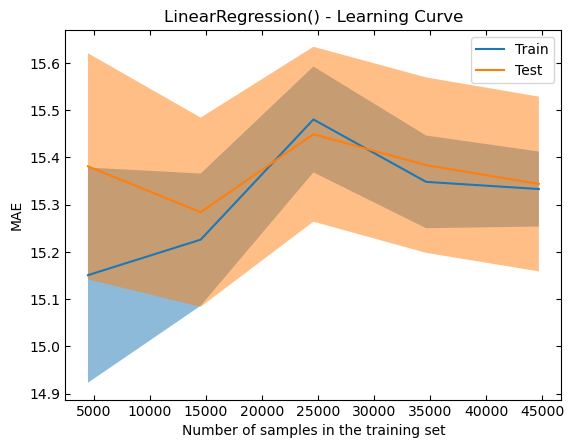

In [89]:
get_crossval_metrics(LinearRegression(), X_train, y_train)

----------------------------------------------------------------------------------------------------
LinearRegression()
Average R2 score of training predictions: 0.98724

Train MSE:              810.349
Train RMSE:              28.467
Train R-Squared:          0.988
Train Adjusted R-Squared: 0.987

Test MSE:               872.042
Test RMSE:               29.530
Test R-Squared:           0.987
Test Adjusted R-Squared:  0.986


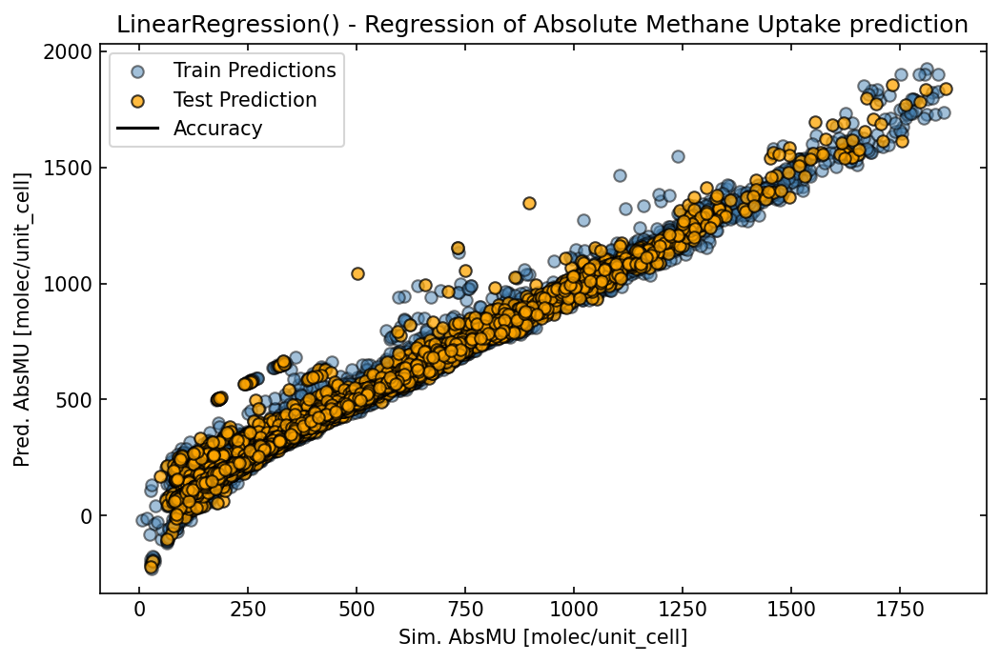

In [44]:
plot_regression_prediction(LinearRegression(), X_train, y_train)

### Tree 

Training metrics suggest data is overfitting

Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 212.06438758629167
Average RMSE score: 14.539177493145452


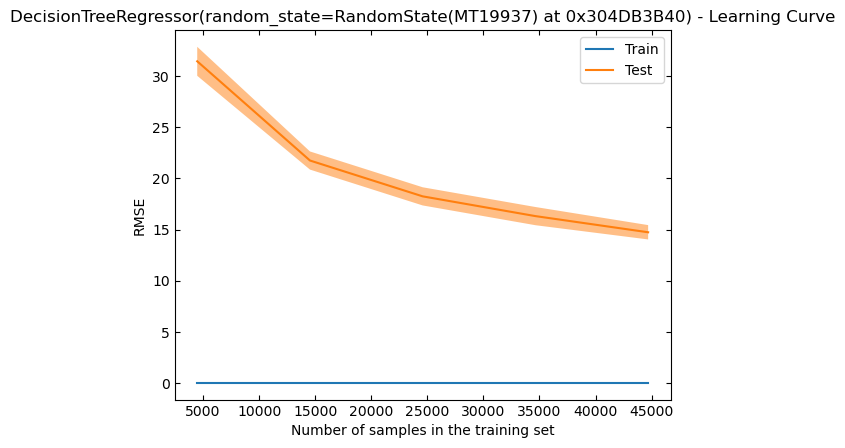

In [45]:
get_crossval_metrics(DecisionTreeRegressor(random_state=random_state), X_train, y_train)

----------------------------------------------------------------------------------------------------
DecisionTreeRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Average R2 score of training predictions: 1.0

Train MSE:                0.000
Train RMSE:               0.000
Train R-Squared:          1.000
Train Adjusted R-Squared: 1.000

Test MSE:               214.310
Test RMSE:               14.639
Test R-Squared:           0.997
Test Adjusted R-Squared:  0.997


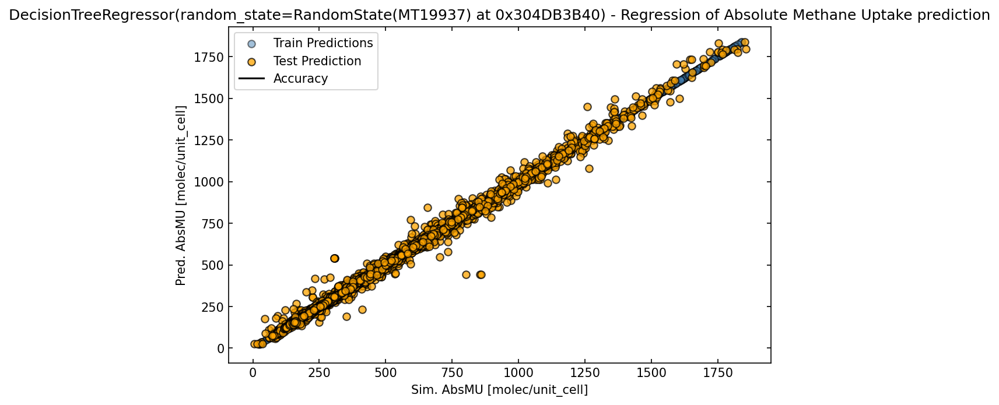

In [46]:
plot_regression_prediction(DecisionTreeRegressor(random_state=random_state), X_relevant, y)


### Ensemble

In [47]:
ensemble = [
    RandomForestRegressor(random_state=random_state),
    AdaBoostRegressor(random_state=random_state),
    BaggingRegressor(random_state=random_state),
    GradientBoostingRegressor(random_state=random_state)
]

Estimator:
RandomForestRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 89.07430883748808
Average RMSE score: 9.414413114354758


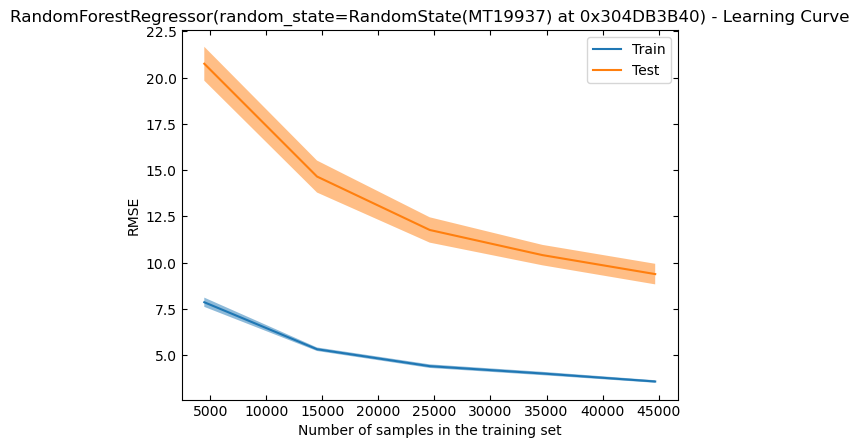

In [55]:
get_crossval_metrics(RandomForestRegressor(random_state=random_state), X_train, y_train)

Estimator:
AdaBoostRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 3351.4016627963238
Average RMSE score: 57.86999771225462


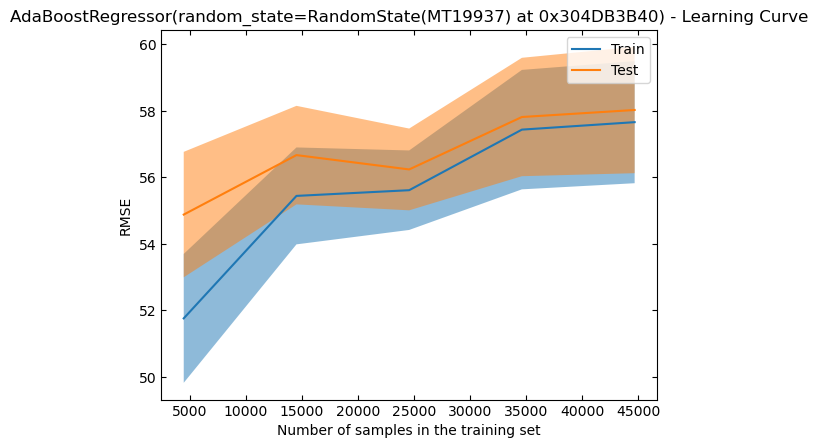

In [56]:
get_crossval_metrics(AdaBoostRegressor(random_state=random_state), X_train, y_train)

Estimator:
BaggingRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 112.09547227437908
Average RMSE score: 10.572626706513338


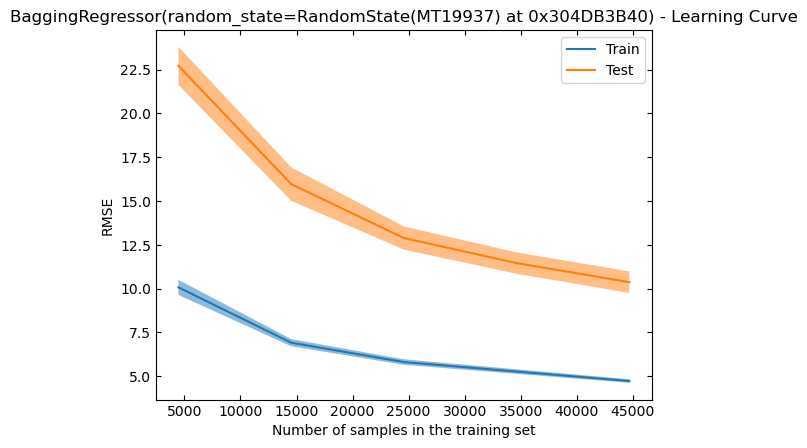

In [57]:
get_crossval_metrics(BaggingRegressor(random_state=random_state), X_train, y_train)

Estimator:
GradientBoostingRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 389.12379614994506
Average RMSE score: 19.722831532988575


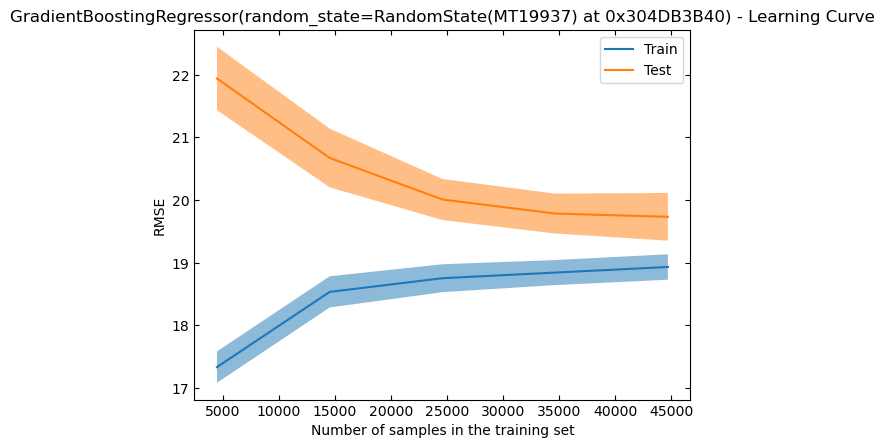

In [58]:
get_crossval_metrics(GradientBoostingRegressor(random_state=random_state), X_train, y_train)

----------------------------------------------------------------------------------------------------
RandomForestRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Average R2 score of training predictions: 1.0

Train MSE:               12.666
Train RMSE:               3.559
Train R-Squared:          1.000
Train Adjusted R-Squared: 1.000

Test MSE:                72.335
Test RMSE:                8.505
Test R-Squared:           0.999
Test Adjusted R-Squared:  0.999
----------------------------------------------------------------------------------------------------
AdaBoostRegressor(random_state=RandomState(MT19937) at 0x304DB3B40)
Average R2 score of training predictions: 0.9490800000000001

Train MSE:             3501.212
Train RMSE:              59.171
Train R-Squared:          0.946
Train Adjusted R-Squared: 0.945

Test MSE:              3495.846
Test RMSE:               59.126
Test R-Squared:           0.948
Test Adjusted R-Squared:  0.947
-----------------------------------

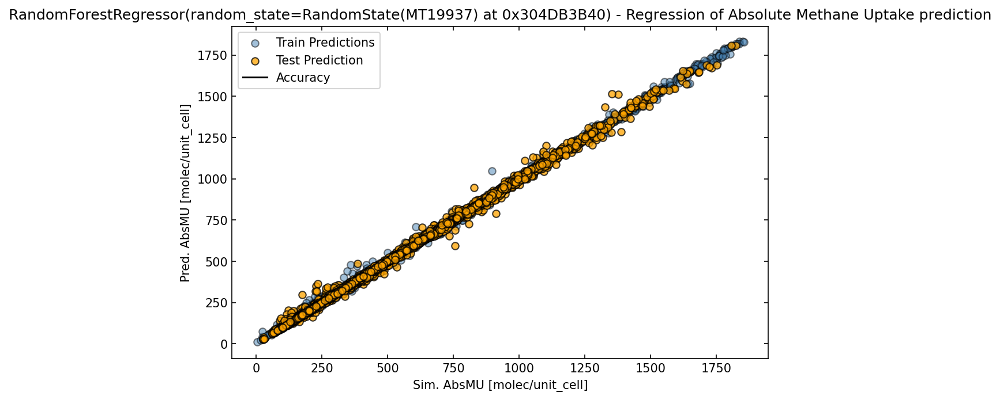

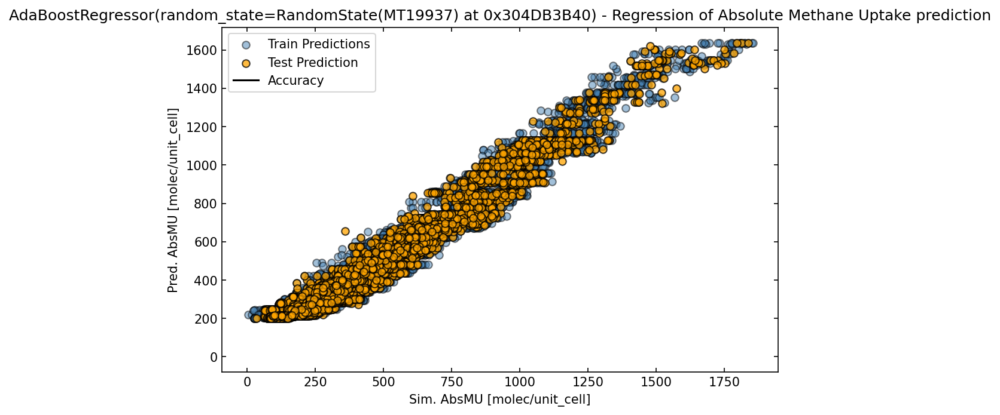

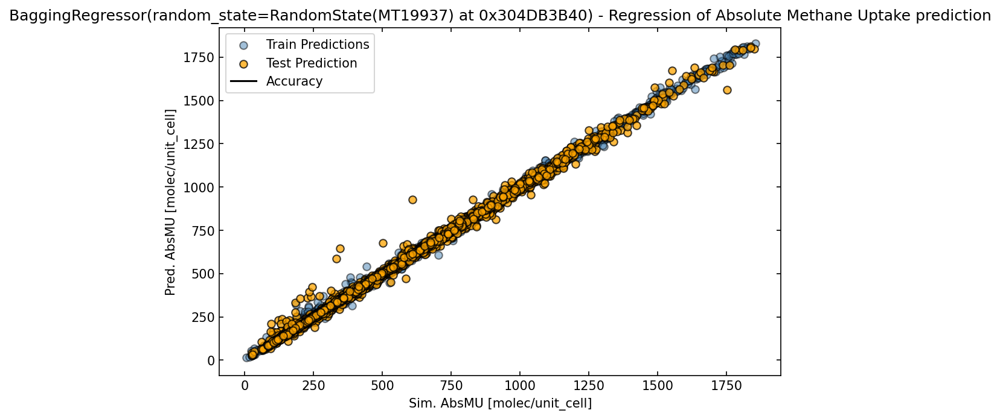

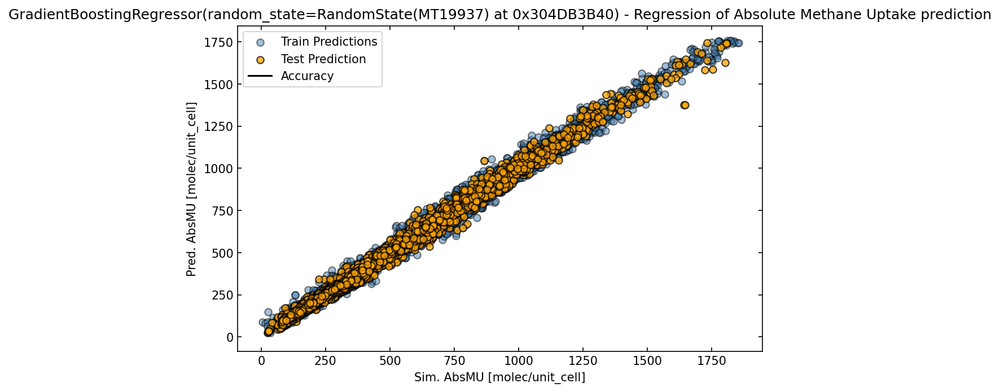

In [60]:
for model in range(len(ensemble)):
    plot_regression_prediction(ensemble[model], X_train, y_train)

### XGBoost()

Normally used to train GBoost DT/models, RF use the same model repr and inference but different training algo. XGBoost can be used to train a standalone RF for GBoosting

Estimator:
XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=275526973, reg_alpha=None, ...)
Number of splits: 5
Number of folds: 10
Scores based on validation splits
Average MSE score: 965.0028490048603
Average RMSE score: 31.05976147174144


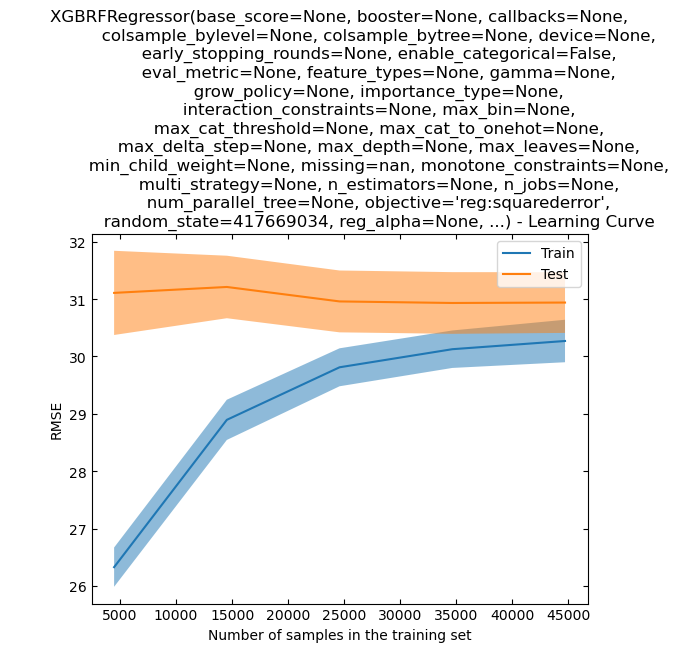

In [59]:
get_crossval_metrics(XGBRFRegressor(random_state=random_state), X_train, y_train)

----------------------------------------------------------------------------------------------------
XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=1949935461, reg_alpha=None, ...)
Average R2 score of training predictions: 0.9857799999999992

Train MSE:              915.780
Train RMSE: 

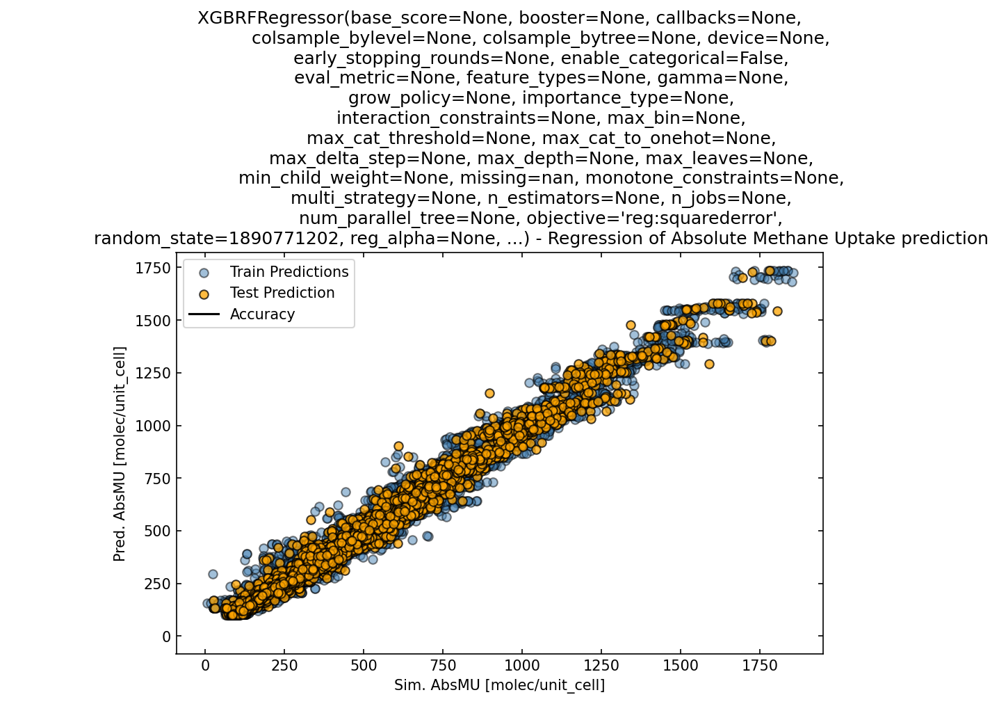

In [61]:
plot_regression_prediction(XGBRFRegressor(random_state=random_state), X_train, y_train)

## Models requiring feature scaling

In [62]:
standard_scaler = StandardScaler()
standard_scaler.fit_transform(X_train, y_train)

X_train_scaled = standard_scaler.transform(X_train)
X_test_scaled = standard_scaler.transform(X_test)

In [71]:
X_train_scaled[0]

array([-1.01553118, -0.85190514,  1.0124877 ,  1.51578753, -0.83836804,
       -1.39352656, -1.452945  , -1.54961392, -1.10280001,  2.03997897,
        1.32617663, -0.80627353, -0.81217828, -0.41739661, -0.22208927,
       -0.70884527, -1.01746046])

### SVM

SVR resulted in the worst RMSE and adjusted-R$^2$score. Probably best to avoid this.

In [ ]:
# support_vectors = [SVR(), NuSVR()]

# for model in range(len(support_vectors)):
#     plot_regression_prediction(support_vectors[model], X_train, y_train, X_test, y_test)

# plot_regression_prediction(SVR(), X_train, y_train, X_test, y_test)


### KNeighbours 

Moderate performance, 

In [64]:
get_crossval_metrics(KNeighborsRegressor(), X_train_scaled, y_train)

Estimator:
KNeighborsRegressor()
Number of splits: 5
Number of folds: 10


AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

In [ ]:
plot_regression_prediction(KNeighborsRegressor(random_state=random_state), X_train_scaled, y_train)


<br>

# HyperParameter Tuning for top K models

Looks like RandomForest performs the best after initial screening, so I will use this estimator to tune the hyperparameters and optimise its performance. 

In [83]:
def objective(trial):
    # suggest values for hyperparameters
    param = {
        'n_estimators': trial.suggest_int("n_estimators", 10, 200, log=True),
        'max_depth': trial.suggest_int("max_depth", 2, 32), 
        'min_samples_split': trial.suggest_int("min_samples_split", 2, 10),
        'min_samples_leaf': trial.suggest_int("min_samples_leaf", 1, 10)
    }
    
    # create and fit RF model
    model = RandomForestRegressor(**param)
    model.fit(X_train, y_train)

    # make preds and calculate RMSE
    tr_pred = model.predict(X_train)
    r_2 = r2_score(y_train, tr_pred)
    rmse = root_mean_squared_error(y_train, tr_pred)
    mae = mean_absolute_error(y_train, tr_pred)
    
    # return MAE
    return mae
    
# create study object
study = optuna.create_study(direction='minimize')

# run optimization process
study.optimize(objective, n_trials=20, show_progress_bar=True, timeout=300)

print(f"Number of finished trails: {len(study.trials)}")
trial = study.best_trial
print(f"Best trial:{trial}")
print(f"Value: {trial.value}")
print("Param: ")
for k, v in trial.params.items():
    print(f'{k}: {v}')

[I 2024-12-10 01:03:55,571] A new study created in memory with name: no-name-10985556-e00c-4ac0-b199-044154ba32eb


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2024-12-10 01:04:00,254] Trial 0 finished with value: 72.20210441166103 and parameters: {'n_estimators': 46, 'max_depth': 2, 'min_samples_split': 8, 'min_samples_leaf': 5}. Best is trial 0 with value: 72.20210441166103.
[I 2024-12-10 01:05:01,905] Trial 1 finished with value: 6.538542504541897 and parameters: {'n_estimators': 132, 'max_depth': 11, 'min_samples_split': 4, 'min_samples_leaf': 10}. Best is trial 1 with value: 6.538542504541897.
[I 2024-12-10 01:05:41,638] Trial 2 finished with value: 2.712148715721244 and parameters: {'n_estimators': 76, 'max_depth': 23, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 2 with value: 2.712148715721244.
[I 2024-12-10 01:07:26,995] Trial 3 finished with value: 2.138145385816655 and parameters: {'n_estimators': 175, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 3 with value: 2.138145385816655.
[I 2024-12-10 01:08:58,078] Trial 4 finished with value: 2.936109951594038 and parameters: {'n_estimat

----------------------------------------------------------------------------------------------------
RandomForestRegressor(max_depth=16, min_samples_leaf=2, min_samples_split=6,
                      n_estimators=175,
                      random_state=RandomState(MT19937) at 0x304DB3B40)
Average R2 score of training predictions: 0.9990000000000004

Train MSE:               57.589
Train RMSE:               7.589
Train R-Squared:          0.999
Train Adjusted R-Squared: 0.999

Test MSE:               272.057
Test RMSE:               16.494
Test R-Squared:           0.996
Test Adjusted R-Squared:  0.996


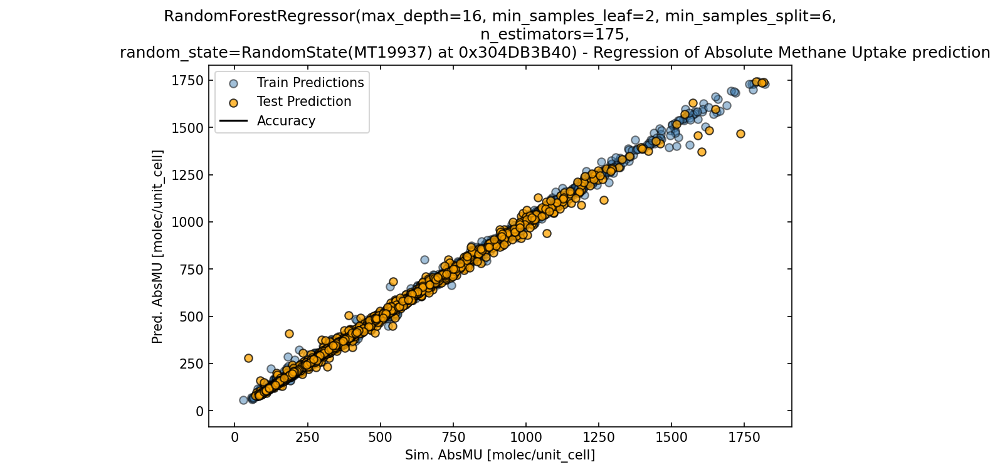

In [84]:
# Model with lowest MAE

plot_regression_prediction(
    RandomForestRegressor(
        n_estimators=175,
        max_depth=16,
        min_samples_split=6,
        min_samples_leaf=2,
        random_state=random_state
), X_test, y_test)